Zhiwei Tan

# Overview  
Project Title: Fake News Detection Algorithm  
Student: Zhiwei, Lanqing Zhao  
## Project Goal  
The primary objective of this project is to develop an algorithm capable of determining whether a news article is fake or real. This involves leveraging a provided dataset containing two files: one with news articles labeled as fake, and another with news labeled as true. Each file includes four columns: title, text, subject, and date.  

The algorithm aims to filter out misinformation from social media platforms, thereby aiding users in accessing reliable information. Success will be measured by the model's accuracy in distinguishing real from fake news, as well as its simplicity and robustness in practical application.  

### Classification Task:  
    The project involves solving a binary classification problem using Natural Language Processing (NLP) techniques. The end goal is to build a classifier that accurately and robustly categorizes news articles.  
    Supervised Learning Methods:  
        Naive Bayes  
        Logistic Regression  
        Support Vector Machine (SVM)  
        K-Nearest Neighbor (KNN)  
        Random Forest  
Type: News articles, both fake and true, with title, text, subject, and date.

In [4]:
import pandas as pd
import os
import re
import spacy
from pathos.multiprocessing import ProcessingPool as Pool
from multiprocessing import cpu_count
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import textwrap
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import numpy as np

### Helper functions

In [5]:
def do_nothing(tokens):
    return tokens

def text_print(typ,loc):
    print(
        'Original text\n',
        textwrap.fill(df[df['true'] == typ]['text'].iloc[loc], width=300),
        '\n\n',
        'Cleaned text\n',
        textwrap.fill(df[df['true'] == typ]['clean_text'].iloc[loc], width=300),
        '\n\nSample Character length:\n',
        len(df[df['true'] == typ]['text'].iloc[loc]),'\n'
        )
    
def eda(df1):
    print(
        'Dataframe Head:\n',
        df1.head(), 
        '\nDataframe shape:\n',
        df1.shape,
        '\nDataframe Discribe:\n',
        df1.describe(include='all').T,
        '\nDataframe null sum:\n',
        df1.isna().sum(),
        '\nDataframe count grouped by target:\n',
        df1.groupby('true').size(),# Grouping the data by true and false, the data is almost perfectly balanced
        )
    
def clean_text(text):
    text = text.lower()
    text = re.sub(r'https?://\S+|www\.\S+|\(?bit.ly/S+\)?|pic.twitter.com/\S+', '', text) # Remove links
    text = re.sub(r'\(@\w+\)|\w+\s\(\w+\)\s\-\s','', text) # Remove the @ tags
    text = re.sub(r'[^a-zA-Z0-9 -]', '',text) # Remove non-alphanumeric characters.
    text = re.sub(r'(\d+)([a-zA-Z]+)', r'\1 \2', text) #put a space between numbers and words
    text = re.sub(r'\s+', ' ', text) # change tabs and extra white space to single whitespace
    
    return text

def process_text(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc if not token.is_stop and not token.is_punct])

def parallel_process(texts):
    with Pool(processes=cpu_count()) as pool:
        results = pool.map(process_text, texts)
    return results

def word_cloud(fak,tru):
    fake_wordcloud = WordCloud(stopwords=set(stopwords.words('english')), max_words=100).generate(fak)
    true_wordcloud = WordCloud(stopwords=set(stopwords.words('english')), max_words=100).generate(tru)
    
    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 2, 1)
    plt.imshow(fake_wordcloud, interpolation='bilinear')
    plt.title('Fake News Word Cloud')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(true_wordcloud, interpolation='bilinear')
    plt.title('Real News Word Cloud')
    plt.axis('off')

    plt.show()

def make_reports(model, xtrain, xtest):
    model_fitted = model.fit(xtrain, y_train)
    ypred = model_fitted.predict(xtest)
    mod_report = classification_report(y_test, ypred, digits=5)
    mod_conf = confusion_matrix(y_test,ypred)
    return(model_fitted,mod_report, mod_conf)
    
def get_best(model, param_grid, xtrain):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search.fit(count_x_train, y_train)
    print(grid_search.best_estimator_)
 

load data locally
look at an example of the data

In [6]:
df = pd.DataFrame()

if os.path.exists('processed_text.csv'):
    df = pd.read_csv('processed_text.csv')
    
else:
    fake_df = pd.DataFrame()
    true_df = pd.DataFrame()
    if os.path.exists('fake.csv'):
        fake_df = pd.read_csv('fake.csv')
        
    else:
        fake = 'https://github.com/emmanueliarussi/DataScienceCapstone/blob/master/3_MidtermProjects/ProjectFN/data/fake.csv?raw=true'
        fake_df = pd.read_csv(fake, index_col=0)
        
    fake_df['true'] = 0
    if os.path.exists('true.csv'):
        true_df = pd.read_csv('true.csv')
    else:
        true = 'https://github.com/emmanueliarussi/DataScienceCapstone/blob/master/3_MidtermProjects/ProjectFN/data/true.csv?raw=true'
        true_df = pd.read_csv(true, index_col=0)
    
    true_df['true'] = 1
    df = pd.concat([fake_df, true_df], ignore_index=True)

    eda(df)

    # since title, subject, and date does not affect the analysis we can drop them
    df.drop(columns=['title','subject','date'],inplace=True) 

In [7]:
if __name__ == "__main__":
    if os.path.exists('processed_text.csv'):
        eda(df)
    else:
        nlp = spacy.load('en_core_web_sm', exclude=["parser"])
        
        df['clean_text'] = df['text'].apply(clean_text)
        
        texts = df['clean_text'].tolist()
        df['tokens'] = parallel_process(texts)
        
        print(f"Sample result: {df['tokens'].iloc[0][:5]}")  # Print first 5 tokens of first text
        
        df = df.convert_dtypes()
        
        print('Missing Entries:\n',
                df.isna().sum(),
                '\n',
                df[df.isna().any(axis=1)])
        
        df.dropna(inplace=True)

Dataframe Head:
                                                 text  true  \
0  Donald Trump just couldn t wish all Americans ...     0   
1  House Intelligence Committee Chairman Devin Nu...     0   
2  On Friday, it was revealed that former Milwauk...     0   
3  On Christmas day, Donald Trump announced that ...     0   
4  Pope Francis used his annual Christmas Day mes...     0   

                                          clean_text  \
0  donald trump just couldn t wish all americans ...   
1  house intelligence committee chairman devin nu...   
2  on friday it was revealed that former milwauke...   
3  on christmas day donald trump announced that h...   
4  pope francis used his annual christmas day mes...   

                                              tokens  
0  donald trump couldn t wish americans happy new...  
1  house intelligence committee chairman devin nu...  
2  friday reveal milwaukee sheriff david clarke c...  
3  christmas day donald trump announce work follo... 

In [8]:
df = df.convert_dtypes()
df.dropna(inplace=True)

In [9]:
df.to_csv('processed_text.csv',index=False)

In [10]:
print('True Story:\n')    
text_print(1,1)
print('Fake Story:\n')
text_print(0,3)

True Story:

Original text
 WASHINGTON (Reuters) - Transgender people will be allowed for the first time to enlist in the U.S. military starting on Monday as ordered by federal courts, the Pentagon said on Friday, after President Donald Trump’s administration decided not to appeal rulings that blocked his transgender ban. Two
federal appeals courts, one in Washington and one in Virginia, last week rejected the administration’s request to put on hold orders by lower court judges requiring the military to begin accepting transgender recruits on Jan. 1. A Justice Department official said the administration will not
challenge those rulings. “The Department of Defense has announced that it will be releasing an independent study of these issues in the coming weeks. So rather than litigate this interim appeal before that occurs, the administration has decided to wait for DOD’s study and will continue to defend the
president’s lawful authority in District Court in the meantime,” the official s

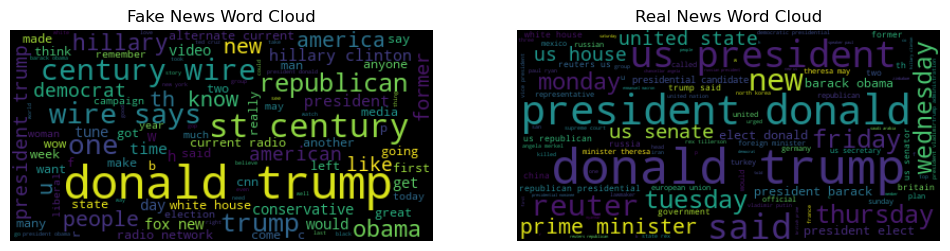

In [11]:
fake_texts = df[df['true'] == 0]['clean_text']
true_texts = df[df['true'] == 1]['clean_text']

word_cloud(fake_texts.to_string(),true_texts.to_string())

In [12]:
X_train, X_test, y_train, y_test = train_test_split(df['tokens'], df['true'], test_size=0.2, random_state=1234)

c = CountVectorizer(stop_words='english', max_df=.4)
count_x_train = c.fit_transform(X_train)
count_x_test = c.transform(X_test)

t = TfidfVectorizer(stop_words='english', max_df=.4)
tfid_x_train = t.fit_transform(X_train)
tfid_x_test = t.transform(X_test)

Minimum error:- 0.10385988398036591 at K = 2


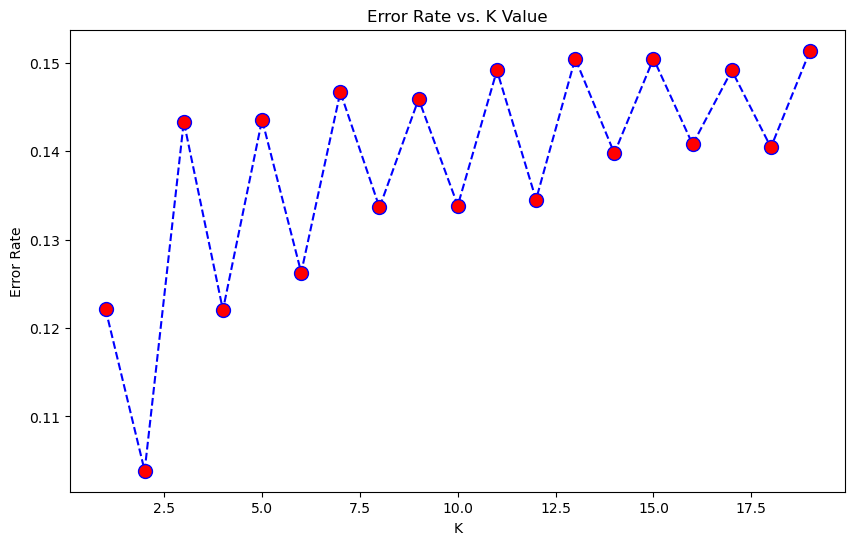

In [13]:
error_rate = []
for i in range(1,20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(tfid_x_train,y_train)
    pred_i = knn.predict(count_x_test)
    error_rate.append(np.mean(pred_i != y_test))
 
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
req_k_value = error_rate.index(min(error_rate))+1
print("Minimum error:-",min(error_rate),"at K =",req_k_value)

Minimum error:- 0.22088353413654618 at K = 1


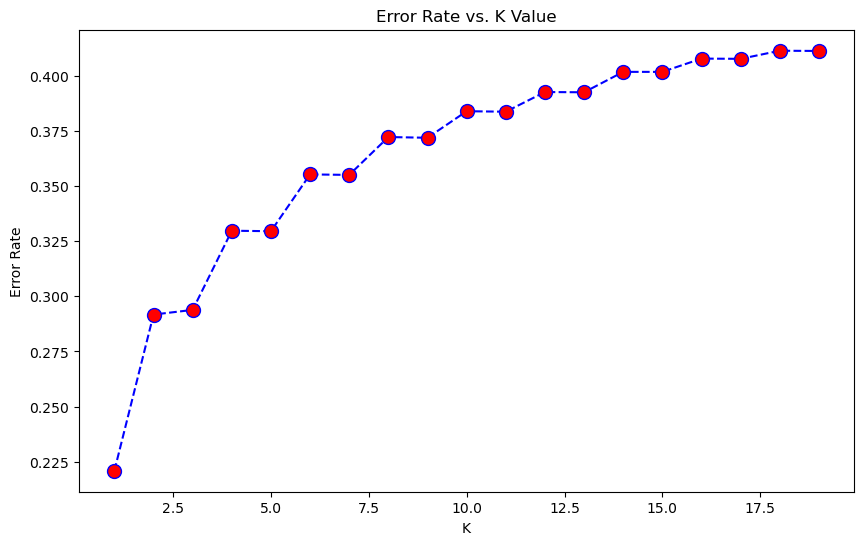

In [14]:
error_rate = []
for i in range(1,20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(tfid_x_train,y_train)
    pred_i = knn.predict(tfid_x_test)
    error_rate.append(np.mean(pred_i != y_test))
 
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
req_k_value = error_rate.index(min(error_rate))+1
print("Minimum error:-",min(error_rate),"at K =",req_k_value)

In [15]:
def make_feature(features, weights):
    feature_importance = pd.DataFrame({'feature': features, 'weight': weights})
    feature_importance = feature_importance.sort_values('weight', ascending=False)

    print("Top 10 features indicating real news:")
    print(feature_importance.head(10))
    print("\nTop 10 features indicating fake news:")
    print(feature_importance.tail(10))
    
    real_news_features = feature_importance[feature_importance['weight'] > 0]
    fake_news_features = feature_importance[feature_importance['weight'] < 0]


    real_news_weights_dict = {feature: weight for feature, weight in zip(real_news_features['feature'], real_news_features['weight'])}
    fake_news_weights_dict = {feature: weight for feature, weight in zip(fake_news_features['feature'], fake_news_features['weight'])}

    wordcloud_real = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(real_news_weights_dict)
    wordcloud_fake = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(fake_news_weights_dict)

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(wordcloud_real, interpolation='bilinear')
    plt.axis('off')
    plt.title('Important Features for Real News')

    plt.subplot(1, 2, 2)
    plt.imshow(wordcloud_fake, interpolation='bilinear')
    plt.axis('off')
    plt.title('Important Features for Fake News')

    plt.show()

In [16]:
c_feature_names = c.get_feature_names_out()
t_feature_names = t.get_feature_names_out()


In [17]:
knn_count, knn_count_report, knn_count_conf_matrix = make_reports(KNeighborsClassifier(n_neighbors=2),count_x_train, count_x_test)
knn_tfid, knn_tfid_report, knn_tfid_conf_matrix = make_reports(KNeighborsClassifier(n_neighbors=1),tfid_x_train, tfid_x_test)

In [18]:
lr_count, lr_count_report, lr_count_conf_matrix = make_reports(LogisticRegression(),count_x_train, count_x_test)
lr_tfid, lr_tfid_report, lr_tfid_conf_matrix = make_reports(LogisticRegression(),tfid_x_train, tfid_x_test)

In [19]:
# param = {
#     'C': [0.001,0.01, 0.1, 1,10,100,1000]
# }

# get_best(LogisticRegression(), param, count_x_train) # LogisticRegression(C=100)
# get_best(LogisticRegression(), param, tfid_x_train) # LogisticRegression(C=100)

In [20]:
lr_count_grid, lr_count_grid_report, lr_count_grid_conf_matrix = make_reports(LogisticRegression(C=100),count_x_train, count_x_test)
lr_tfid_grid, lr_tfid_grid_report, lr_tfid_grid_conf_matrix = make_reports(LogisticRegression(C=100),tfid_x_train, tfid_x_test)

In [21]:
nb_count, nb_count_report, nb_count_conf_matrix = make_reports(MultinomialNB(),count_x_train, count_x_test)
nb_tfid, nb_tfid_report, nb_tfid_conf_matrix = make_reports(MultinomialNB(),tfid_x_train, tfid_x_test)

In [22]:
# param = {
#     'alpha': [0.1, 0.5, 1.0]
# }

# get_best(MultinomialNB(), param, count_x_train) # MultinomialNB(alpha=0.1)
# get_best(MultinomialNB(), param, tfid_x_train) # MultinomialNB(alpha=0.1)

In [23]:
nb_count_grid, nb_count_grid_report, nb_count_grid_conf_matrix = make_reports(MultinomialNB(alpha=0.1),count_x_train, count_x_test)
nb_tfid_grid, nb_tfid_grid_report, nb_tfid_grid_conf_matrix = make_reports(MultinomialNB(alpha=0.1),tfid_x_train, tfid_x_test)

In [24]:
linearsvm_count, linearsvm_count_report, linearsvm_count_conf_matrix = make_reports(LinearSVC(max_iter=100000),count_x_train, count_x_test)
linearsvm_tfid, linearsvm_tfid_report, linearsvm_tfid_conf_matrix = make_reports(LinearSVC(max_iter=100000),tfid_x_train, tfid_x_test)

/opt/anaconda3/envs/m1_nlp/lib/python3.9/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/envs/m1_nlp/lib/python3.9/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


In [25]:
# param = {
#     'C': [10, 15, 20, 25, 30,35]
# }

# get_best(LinearSVC(max_iter=100000), param, count_x_train) #LinearSVC(C=30, max_iter=100000)


In [26]:
linearsvm_count_grid, linearsvm_count_grid_report, linearsvm_count_grid_conf_matrix = make_reports(LinearSVC(C=30, max_iter=100000),count_x_train, count_x_test)
linearsvm_tfid_grid, linearsvm_tfid_grid_report, linearsvm_tfid_grid_conf_matrix = make_reports(LinearSVC(C=30, max_iter=100000),tfid_x_train, tfid_x_test)

/opt/anaconda3/envs/m1_nlp/lib/python3.9/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/envs/m1_nlp/lib/python3.9/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


In [40]:
svm_count, svm_count_report, svm_count_conf_matrix = make_reports(SVC(max_iter=100000),count_x_train, count_x_test)
svm_tfid, svm_tfid_report, svm_tfid_conf_matrix = make_reports(SVC(max_iter=100000),tfid_x_train, tfid_x_test)

In [ ]:
# param = {
#     'C': [10, 20, 30 ],
#     'gamma': [0.1, 1]
# }
# get_best(SVC(max_iter=100000), param, count_x_train) # SVC(C=20, gamma=0.1, max_iter=100000)

In [41]:
svm_count_grid, svm_count_grid_report, svm_count_grid_conf_matrix = make_reports(SVC(C=20, gamma=0.1, max_iter=100000),count_x_train, count_x_test)
svm_tfid_grid, svm_tfid_grid_report, svm_tfid_grid_conf_matrix = make_reports(SVC(C=20, gamma=0.1, max_iter=100000),tfid_x_train, tfid_x_test)

In [42]:
rf_count, rf_count_report, rf_count_conf_matrix = make_reports(RandomForestClassifier(),count_x_train, count_x_test)
rf_tfid, rf_tfid_report, rf_tfid_conf_matrix = make_reports(RandomForestClassifier(),tfid_x_train, tfid_x_test)

In [ ]:
# param = {
#     'n_estimators': [450, 500, 550],
#     'max_features': ['sqrt', 'log2'],
#     'max_depth' : [8, 9, 10]
# }
# get_best(RandomForestClassifier(), param, count_x_train) # RandomForestClassifier(max_depth=10, n_estimators=500)

In [43]:
rf_count_grid, rf_count_grid_report_grid, rf_count_grid_conf_matrix = make_reports(RandomForestClassifier(max_depth=10, n_estimators=500),count_x_train, count_x_test)
rf_tfid_grid, rf_tfid_grid_report, rf_tfid_grid_conf_matrix = make_reports(RandomForestClassifier(max_depth=10, n_estimators=500),tfid_x_train, tfid_x_test)

#### Scores

In [28]:
def print_scores(name, model_count_report, model_count_conf, model_tfid_report, model_tfid_conf):
  print(
      f'''
{name} count Confusion Matrix:
{model_count_conf} 

{name} tfid Confusion Matrix:
{model_tfid_conf}

{name} count Classification report:
{model_count_report}

{name} tfid Classification report:
{model_tfid_report}
      ''')

In [29]:
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def make_dec_func_df(y_true, x_val, model):
    y_true = y_true.to_numpy()
    dec_func = model.decision_function(x_val)
    y_pred = model.predict(x_val)
    placeholder = {
    'Sample Index': range(len(y_true)),
    'Decision Function Value': dec_func,
    'Actual Label': y_true,
    'Predicted Label': y_pred,
    'Correct': ['Correct' if pred == actual else 'Incorrect' for pred, actual in zip(y_pred, y_true)],
    }
    return pd.DataFrame(placeholder)

def scatter_plot(df2, func='Decision Function Value'):
    fig, ax = plt.subplots(figsize=(12, 6))

    markers = {0: 'o', 1: 's'}
    hist_correct = sns.scatterplot(
       data=df2[df2['Correct'] == 'Correct'], x='Sample Index', y=func, hue='Actual Label', 
        palette=["blue", "darkgreen"], style='Actual Label', markers=markers, ax=ax,
        legend='brief'
        )
    hist_incorrect = sns.scatterplot(
        data=df2[df2['Correct'] == 'Incorrect'], x='Sample Index', y=func, color='red', 
        style='Predicted Label', ax=ax, legend='brief'
        )
    plt.axhline(y=0, color='gray', linestyle='--')
    
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Correct False', markerfacecolor='blue', markersize=10),
        Line2D([0], [0], marker='s', color='w', label='Correct True', markerfacecolor='darkgreen', markersize=10),
        Line2D([0], [0], marker='o', color='w', label='Incorrect False', markerfacecolor='red', markersize=10),
        Line2D([0], [0], marker='X', color='w', label='Incorrect True', markerfacecolor='red', markersize=10)
                   ]
    
    ax.legend(handles=legend_elements)
    ax.set_title('Distribution of Decision Function Values for Correct and Incorrect Predictions')
    plt.tight_layout()
    plt.show()

def his_plot(df2, func='Decision Function Value'):
    fig, ax = plt.subplots(figsize=(12, 6))
    
    hist_correct = sns.histplot(
        data=df2[df2['Correct'] == 'Correct'], x=func, hue='Actual Label', 
        palette=["blue", "darkgreen"], label='Correct pred', ax=ax
        )
    hist_incorrect = sns.histplot(
        data=df2[df2['Correct'] == 'Incorrect'], x=func, label='Incorrect',
                                color='red', ax=ax
                                )
    plt.axvline(x=0, color='gray', linestyle='--')

    legend_elements = [
        Patch(facecolor='blue', edgecolor='black', label='Correct False'),
        Patch(facecolor='darkgreen', edgecolor='black', label='Correct True'),
        Patch(facecolor='red', edgecolor='black', label='Incorrect')
    ]
    
    ax.legend(handles=legend_elements)
    ax.set_title('Distribution of Decision Function Values for Correct and Incorrect Predictions')
    plt.tight_layout()
    plt.show()

def make_plot_df(df2):
    scatter_plot(df2)
    his_plot(df2)


In [30]:
def make_prob_df(y_true, x_val, model):
    model_prob = model.predict_proba(x_val)[:, 1]
    y_pred = model.predict(x_val)

    plot_data = {
        'Sample Index': range(len(y_true)),
        'Predicted Probability': model_prob,
        'Actual Label': y_test,
        'Predicted Label': y_pred,
        'Correct': ['Correct' if pred == actual else 'Incorrect' for pred, actual in zip(y_pred, y_test)],
    }

    return pd.DataFrame(plot_data)

def make_plot_df_prob(df2):
    scatter_plot(df2, 'Predicted Probability')
    his_plot(df2, 'Predicted Probability')
    
def make_feature(feature_importance):
    print("Top 10 features indicating real news:")
    print(feature_importance.head(10))
    print("\nTop 10 features indicating fake news:")
    print(feature_importance.tail(10))

    real_news_features = feature_importance[feature_importance['weight'] > 0]
    fake_news_features = feature_importance[feature_importance['weight'] < 0]

    real_news_weights_dict = {feature: weight for feature, weight in zip(real_news_features['feature'], real_news_features['weight'])}
    fake_news_weights_dict = {feature: weight for feature, weight in zip(fake_news_features['feature'], fake_news_features['weight'])}

    wordcloud_real = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(real_news_weights_dict)
    wordcloud_fake = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(fake_news_weights_dict)

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(wordcloud_real, interpolation='bilinear')
    plt.axis('off')
    plt.title('Important Features for Real News')

    plt.subplot(1, 2, 2)
    plt.imshow(wordcloud_fake, interpolation='bilinear')
    plt.axis('off')
    plt.title('Important Features for Fake News')

    plt.show()

In [31]:
print_scores('KNeighbors Classifier',
             knn_count_report, knn_count_conf_matrix, 
             knn_tfid_report, knn_tfid_conf_matrix
             )


KNeighbors Classifier count Confusion Matrix:
[[4192  505]
 [1328 2939]] 

KNeighbors Classifier tfid Confusion Matrix:
[[4528  169]
 [1811 2456]]

KNeighbors Classifier count Classification report:
              precision    recall  f1-score   support

         0.0    0.75942   0.89248   0.82059      4697
         1.0    0.85337   0.68877   0.76229      4267

    accuracy                        0.79552      8964
   macro avg    0.80639   0.79063   0.79144      8964
weighted avg    0.80414   0.79552   0.79284      8964


KNeighbors Classifier tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.71431   0.96402   0.82059      4697
         1.0    0.93562   0.57558   0.71271      4267

    accuracy                        0.77912      8964
   macro avg    0.82496   0.76980   0.76665      8964
weighted avg    0.81966   0.77912   0.76924      8964

      


KNeighbors Classifier
Count Vectorizer


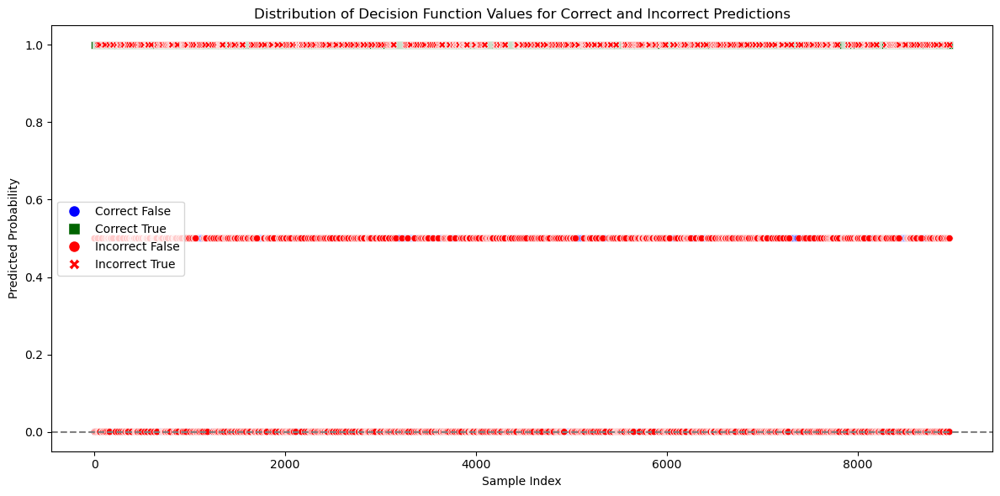

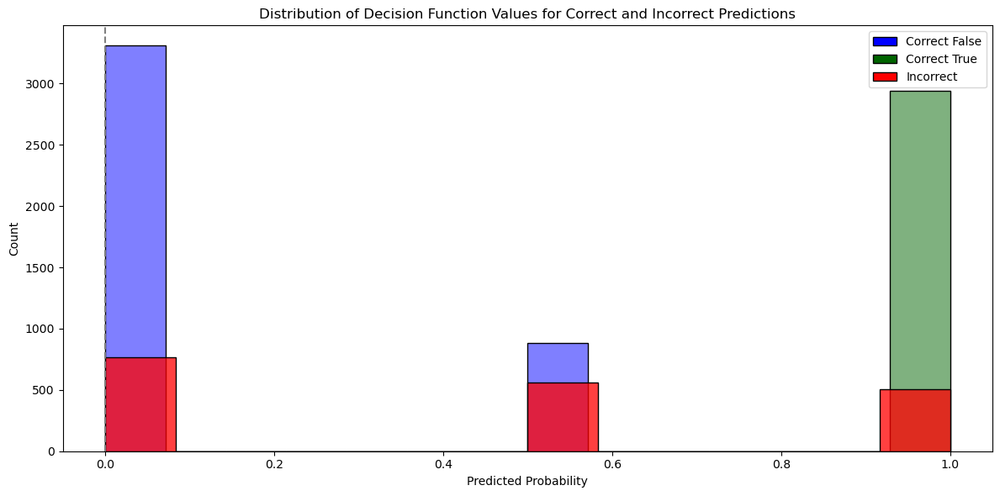


TFIDF Vectorizer


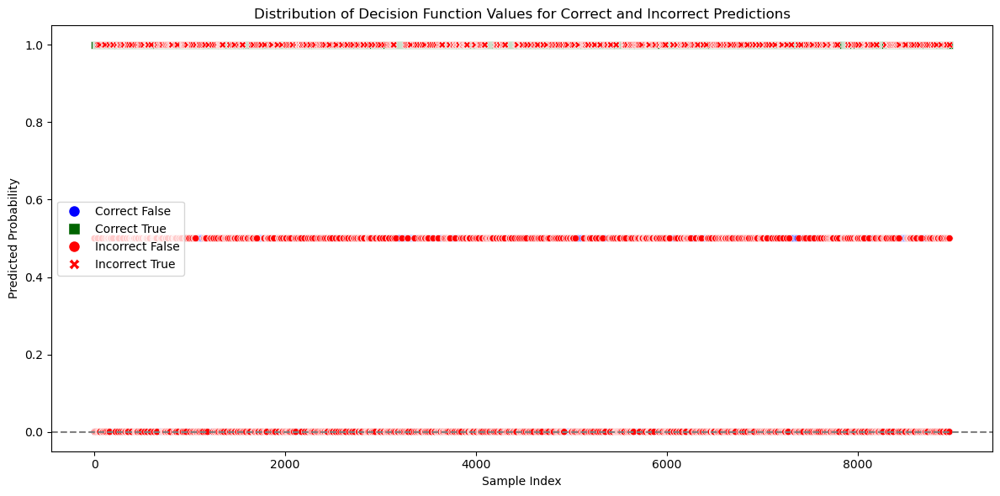

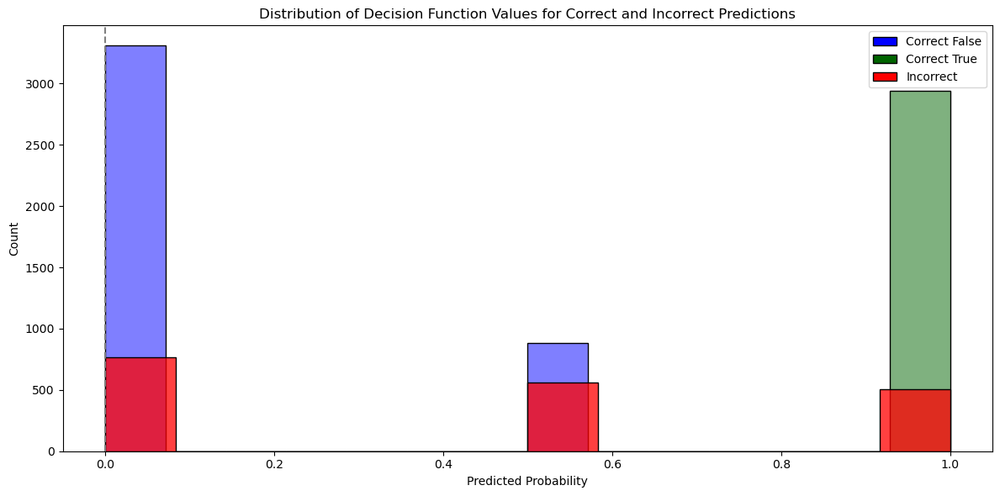

In [32]:
print('KNeighbors Classifier')
print('Count Vectorizer')
knn_count_plot_df = make_prob_df(y_test,count_x_test, knn_count)
make_plot_df_prob(knn_count_plot_df)
print('\nTFIDF Vectorizer')
knn_tfid_plot_df = make_prob_df(y_test,tfid_x_test, knn_tfid)
make_plot_df_prob(knn_count_plot_df)


In [33]:
print_scores('Logistic Regression', 
             lr_count_report, lr_count_conf_matrix,
             lr_tfid_report, lr_tfid_conf_matrix
             )

print_scores('Logistic Regression Gridsearch', 
             lr_count_grid_report, lr_count_grid_conf_matrix,
             lr_tfid_grid_report, lr_tfid_grid_conf_matrix
             )


Logistic Regression count Confusion Matrix:
[[4632   65]
 [  86 4181]] 

Logistic Regression tfid Confusion Matrix:
[[4577  120]
 [ 102 4165]]

Logistic Regression count Classification report:
              precision    recall  f1-score   support

         0.0    0.98177   0.98616   0.98396      4697
         1.0    0.98469   0.97985   0.98226      4267

    accuracy                        0.98315      8964
   macro avg    0.98323   0.98300   0.98311      8964
weighted avg    0.98316   0.98315   0.98315      8964


Logistic Regression tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.97820   0.97445   0.97632      4697
         1.0    0.97200   0.97610   0.97404      4267

    accuracy                        0.97523      8964
   macro avg    0.97510   0.97527   0.97518      8964
weighted avg    0.97525   0.97523   0.97524      8964

      

Logistic Regression Gridsearch count Confusion Matrix:
[[4631   66]
 [  90 4177]] 

Logistic Re

Logistic Regression
Count Vectorizer


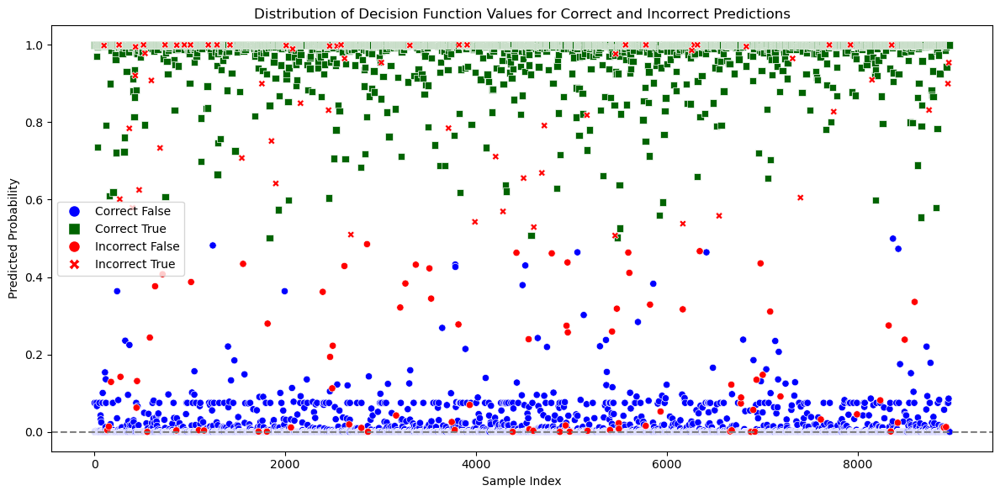

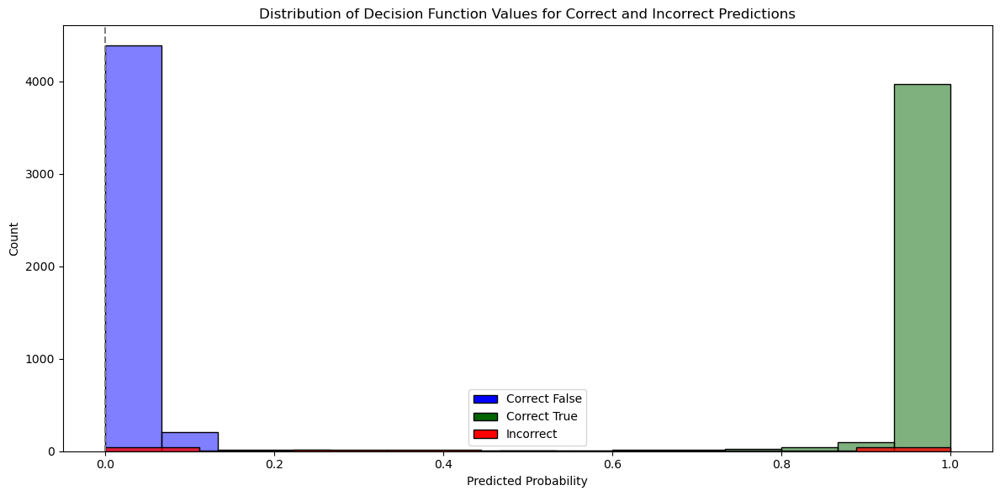


TFIDF Vectorizer


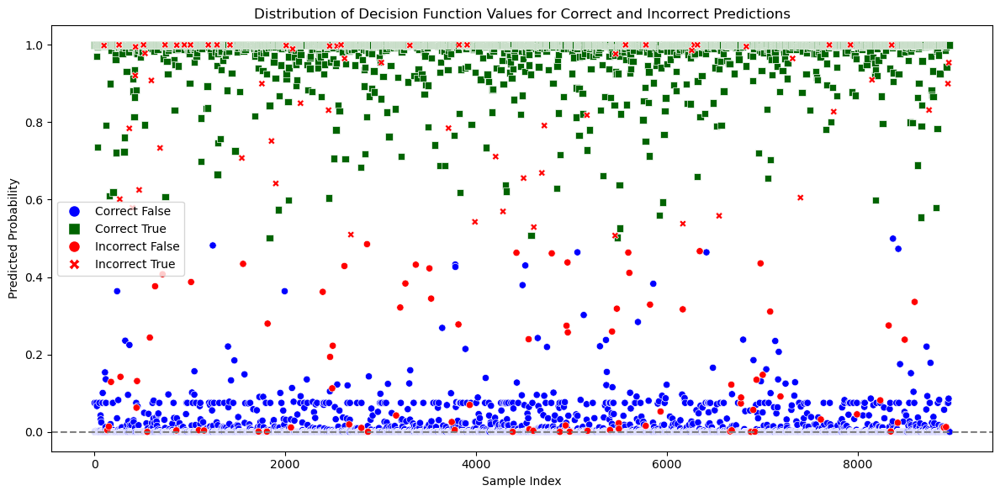

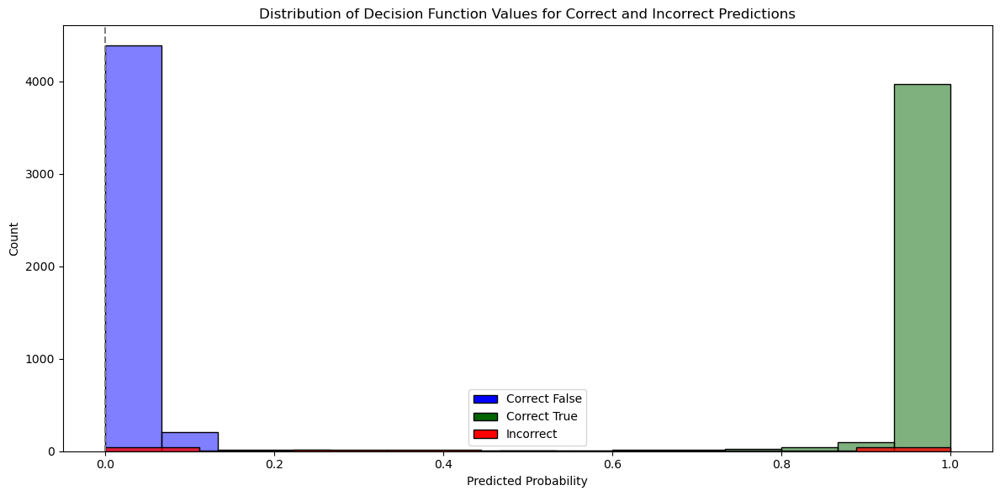


Count Vectorizer Gridsearch


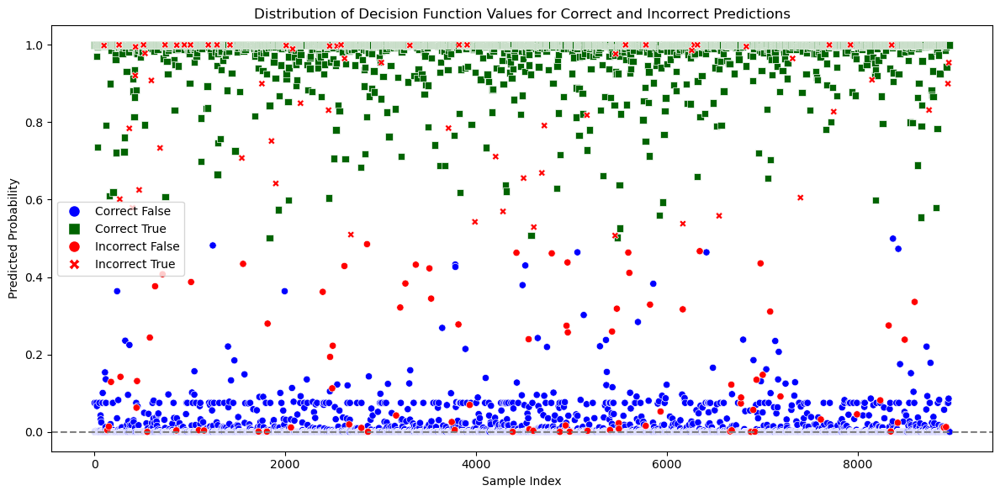

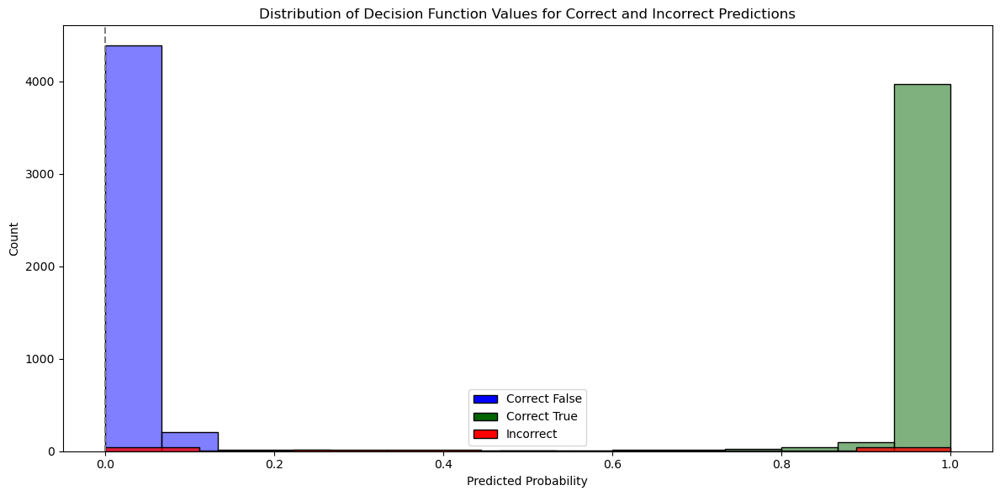


TFIDF VectorizerGridsearch


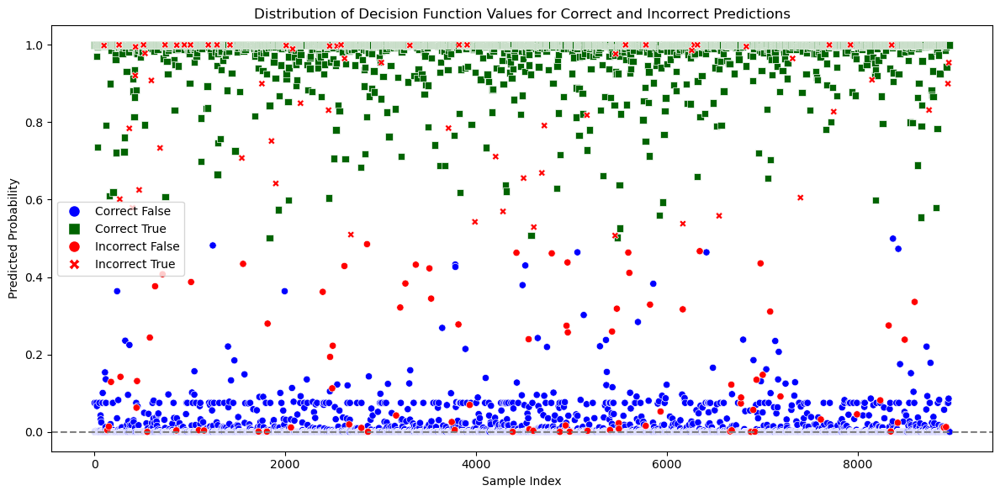

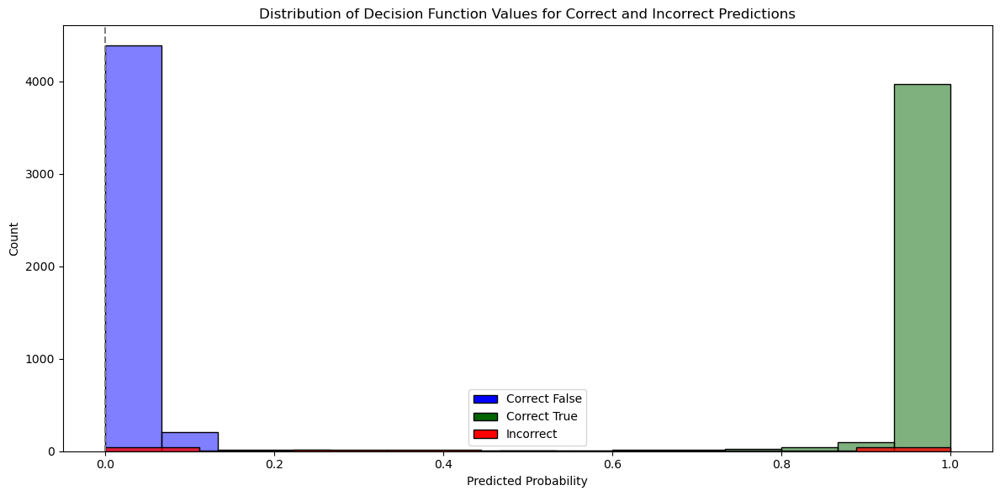

In [ ]:
print('Logistic Regression')
print('Count Vectorizer')
lr_count_plot_df = make_prob_df(y_test,count_x_test, lr_count)
make_plot_df_prob(lr_count_plot_df)
print('\nTFIDF Vectorizer')
lr_tfid_plot_df = make_prob_df(y_test,tfid_x_test, lr_tfid)
make_plot_df_prob(lr_count_plot_df)

print('\nCount Vectorizer Gridsearch')
lr_count_grid_plot_df = make_prob_df(y_test,count_x_test, lr_count_grid)
make_plot_df_prob(lr_count_plot_df)
print('\nTFIDF VectorizerGridsearch')
lr_tfid_grid_plot_df = make_prob_df(y_test,tfid_x_test, lr_tfid_grid)
make_plot_df_prob(lr_count_plot_df)

Top 10 features indicating real news:
          feature    weight
142692     trumps  3.539114
117425    reuters  3.405809
151364  wednesday  2.967335
139188   thursday  2.923320
143099    tuesday  2.722016
54872      friday  2.595094
90458      monday  2.580106
133733     sunday  1.901148
97702      obamas  1.703517
121970   saturday  1.664925

Top 10 features indicating fake news:
          feature    weight
72077         isn -1.665156
153290       wire -1.712551
84300        mail -1.766361
115654        rep -1.881463
42837         don -1.899149
22226   breitbart -1.980831
42526       doesn -2.060527
40733        didn -2.094526
67874       image -2.728070
58325         gop -2.939685


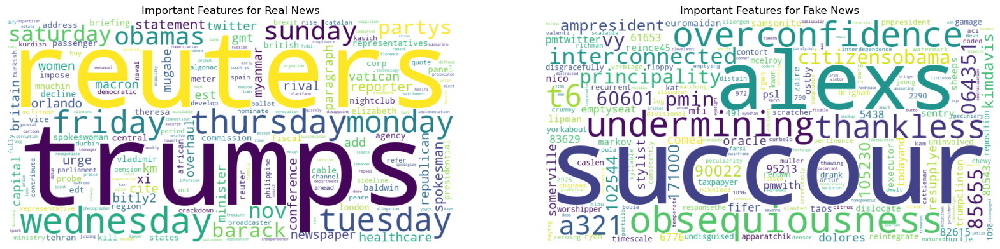

Top 10 features indicating real news:
          feature     weight
142692     trumps  11.889099
117425    reuters  10.202556
151364  wednesday   9.428504
139188   thursday   8.860605
143099    tuesday   8.790730
54872      friday   7.922376
90458      monday   7.572950
130185  spokesman   5.776943
89292    minister   5.714848
117424     reuter   5.674290

Top 10 features indicating fake news:
       feature     weight
97571    obama  -5.116732
91838       mr  -5.171170
64106  hillary  -5.238012
42526    doesn  -5.347235
40733     didn  -5.385651
10409  america  -5.830224
2017      2017  -6.285002
42837      don  -6.287885
58325      gop  -6.637789
67874    image -11.194067


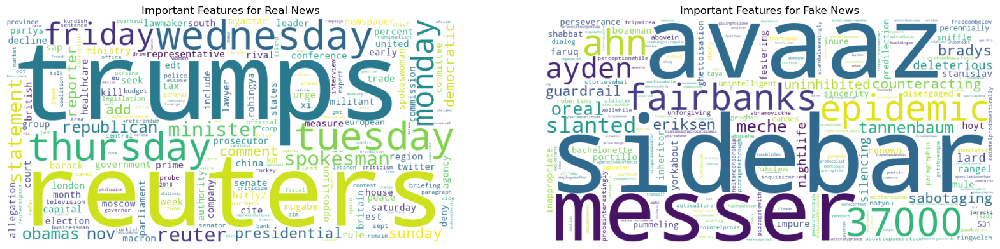

In [35]:
lr_c_feature_weights = lr_count.coef_[0]

lr_c_feature_importance = pd.DataFrame({'feature': c_feature_names, 'weight': lr_c_feature_weights})
lr_c_feature_importance = lr_c_feature_importance.sort_values('weight', ascending=False)

make_feature(lr_c_feature_importance)

lr_t_feature_weights= lr_tfid.coef_[0]

lr_t_feature_names = pd.DataFrame({'feature': t_feature_names, 'weight': lr_t_feature_weights})
lr_t_feature_names = lr_t_feature_names.sort_values('weight', ascending=False)

make_feature(lr_t_feature_names)

In [36]:
print_scores('Multinomial NB', 
             nb_count_report, nb_count_conf_matrix,
             nb_tfid_report, nb_tfid_conf_matrix
             )

print_scores('Multinomial NB Gridsearch', 
             nb_count_grid_report, nb_count_grid_conf_matrix,
             nb_tfid_grid_report, nb_tfid_grid_conf_matrix
             )


Multinomial NB count Confusion Matrix:
[[4458  239]
 [ 216 4051]] 

Multinomial NB tfid Confusion Matrix:
[[4376  321]
 [ 260 4007]]

Multinomial NB count Classification report:
              precision    recall  f1-score   support

         0.0    0.95379   0.94912   0.95145      4697
         1.0    0.94429   0.94938   0.94683      4267

    accuracy                        0.94924      8964
   macro avg    0.94904   0.94925   0.94914      8964
weighted avg    0.94927   0.94924   0.94925      8964


Multinomial NB tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.94392   0.93166   0.93775      4697
         1.0    0.92583   0.93907   0.93240      4267

    accuracy                        0.93519      8964
   macro avg    0.93487   0.93536   0.93508      8964
weighted avg    0.93531   0.93519   0.93520      8964

      

Multinomial NB Gridsearch count Confusion Matrix:
[[4515  182]
 [ 209 4058]] 

Multinomial NB Gridsearch tfid Confu

Multinomial NB

Count Vectorizer


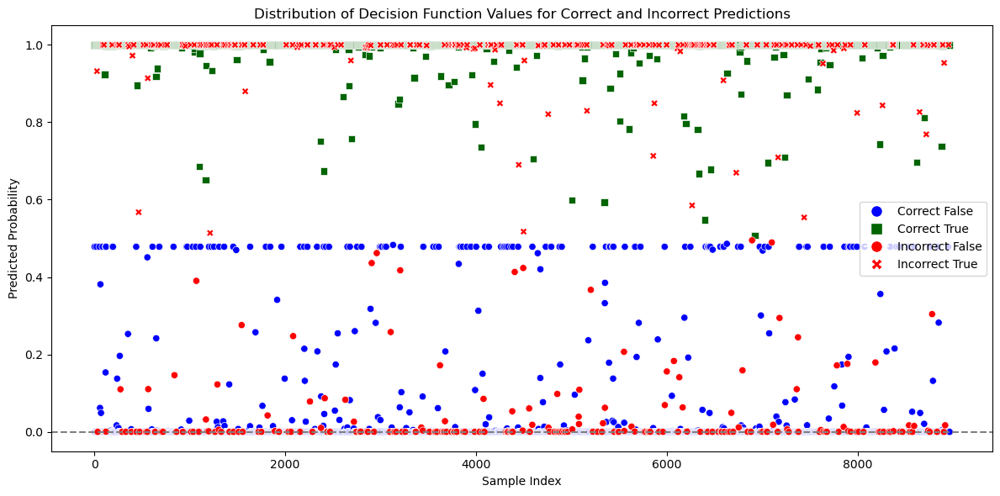

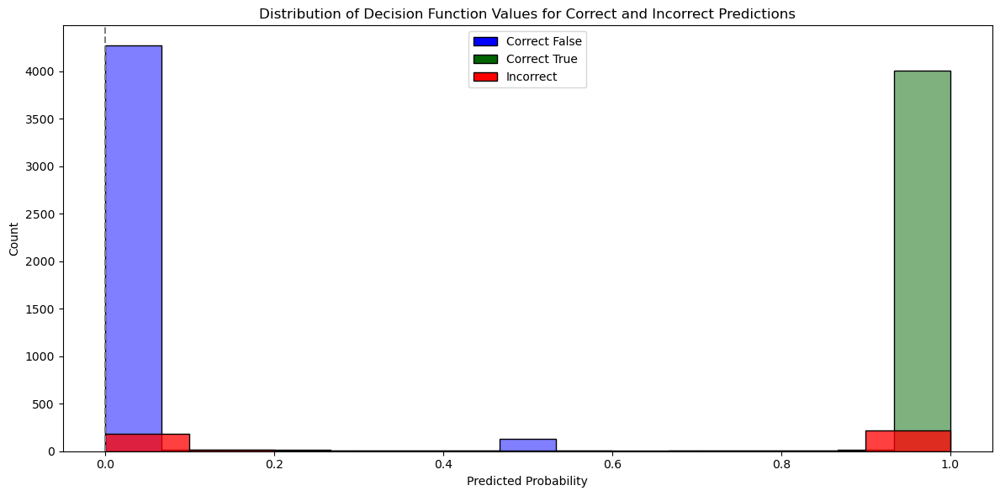


TFIDF Vectorizer


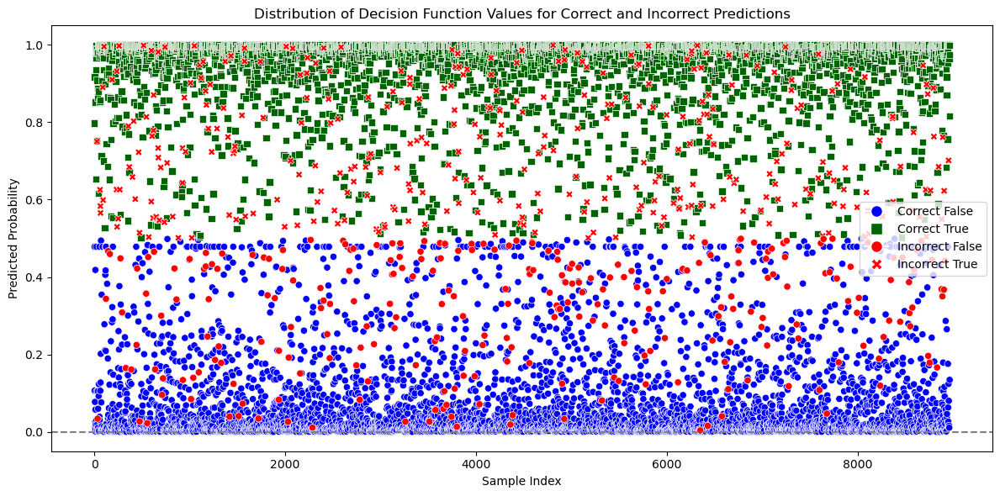

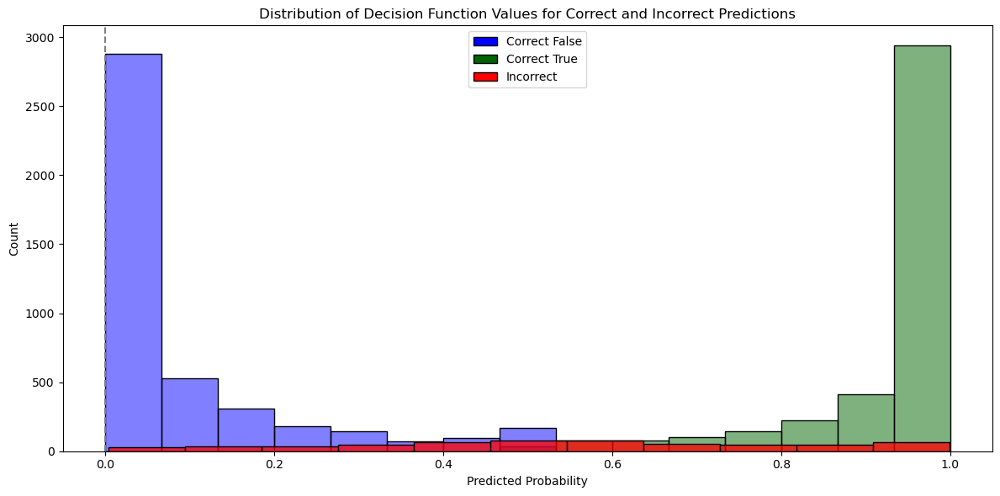


Multinomial NB Gridsearch

Count Vectorizer Gridsearch


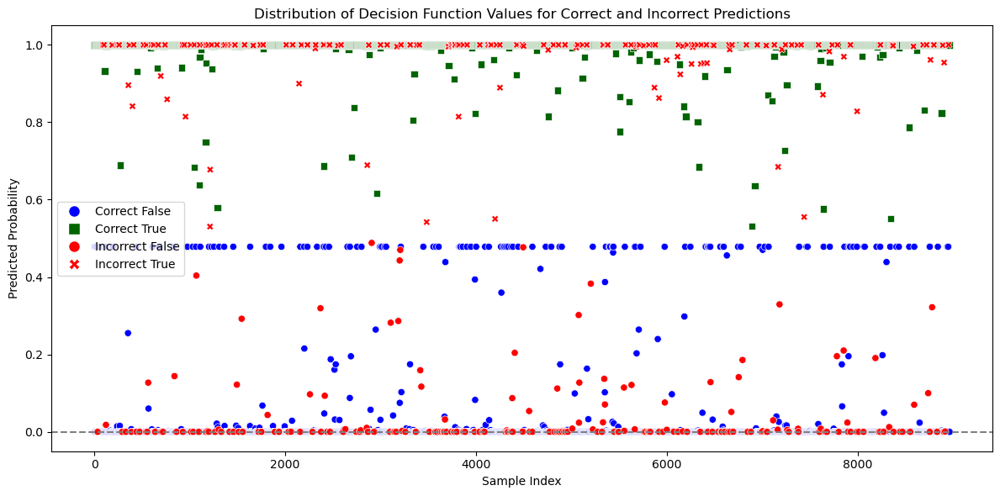

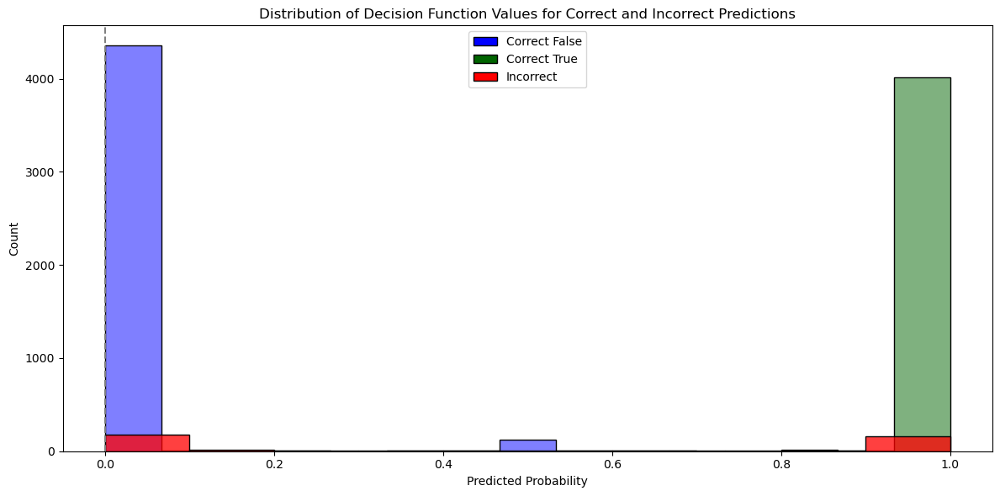


TFIDF Vectorizer Gridsearch


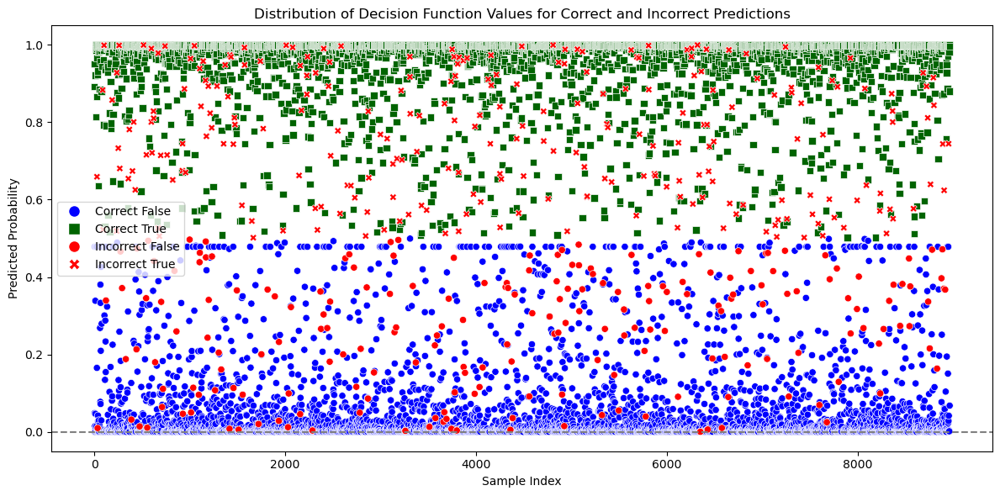

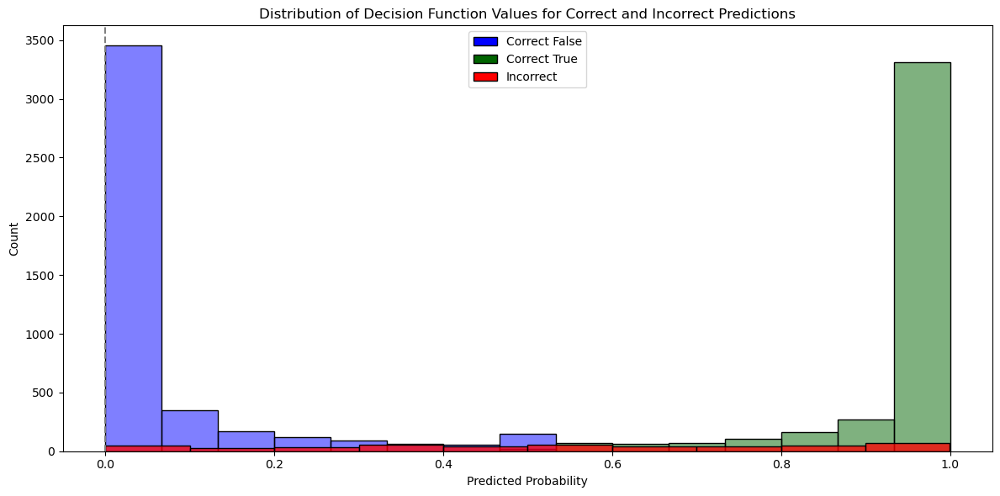

In [ ]:
print('Multinomial NB')
print('\nCount Vectorizer')
nb_count_plot_df = make_prob_df(y_test,count_x_test, nb_count)
make_plot_df_prob(nb_count_plot_df)

print('\nTFIDF Vectorizer')
nb_tfid_plot_df = make_prob_df(y_test,tfid_x_test, nb_tfid)
make_plot_df_prob(nb_tfid_plot_df)

print('\nMultinomial NB Gridsearch')
print('\nCount Vectorizer Gridsearch')
nb_count_plot_df = make_prob_df(y_test,count_x_test, nb_count_grid)
make_plot_df_prob(nb_count_plot_df)

print('\nTFIDF Vectorizer Gridsearch')
nb_tfid_plot_df = make_prob_df(y_test,tfid_x_test, nb_tfid_grid)
make_plot_df_prob(nb_tfid_plot_df)

In [37]:
print_scores('Linear SVM', 
            linearsvm_count_report, linearsvm_count_conf_matrix,
            linearsvm_tfid_report, linearsvm_tfid_conf_matrix
             )

print_scores('Linear SVM Gridsearch',
             linearsvm_count_grid_report, linearsvm_count_grid_conf_matrix,
             linearsvm_tfid_grid_report, linearsvm_tfid_grid_conf_matrix
             )


Linear SVM count Confusion Matrix:
[[4618   79]
 [  98 4169]] 

Linear SVM tfid Confusion Matrix:
[[4646   51]
 [  61 4206]]

Linear SVM count Classification report:
              precision    recall  f1-score   support

         0.0    0.97922   0.98318   0.98120      4697
         1.0    0.98140   0.97703   0.97921      4267

    accuracy                        0.98025      8964
   macro avg    0.98031   0.98011   0.98020      8964
weighted avg    0.98026   0.98025   0.98025      8964


Linear SVM tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.98704   0.98914   0.98809      4697
         1.0    0.98802   0.98570   0.98686      4267

    accuracy                        0.98751      8964
   macro avg    0.98753   0.98742   0.98748      8964
weighted avg    0.98751   0.98751   0.98750      8964

      

Linear SVM Gridsearch count Confusion Matrix:
[[4619   78]
 [ 103 4164]] 

Linear SVM Gridsearch tfid Confusion Matrix:
[[4645   52

Linear SVM
Count Vectorizer


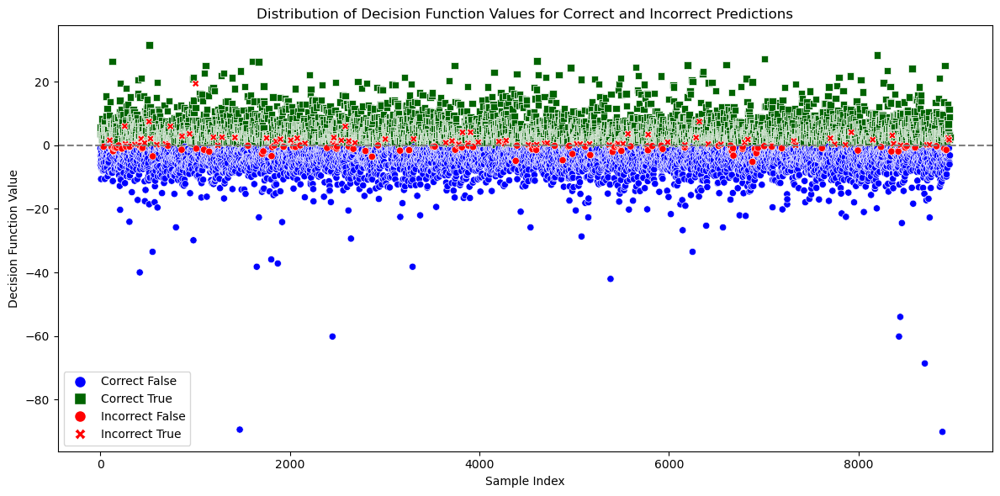

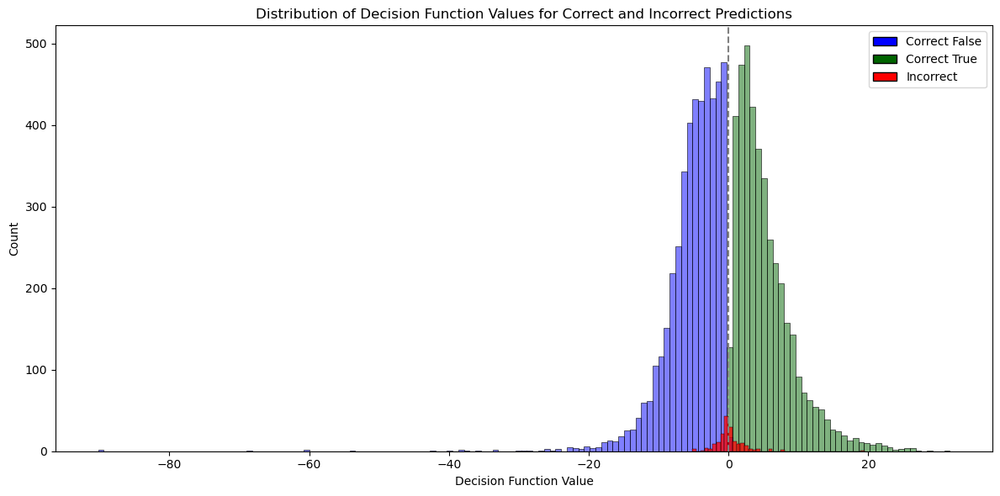


TFIDF Vectorizer


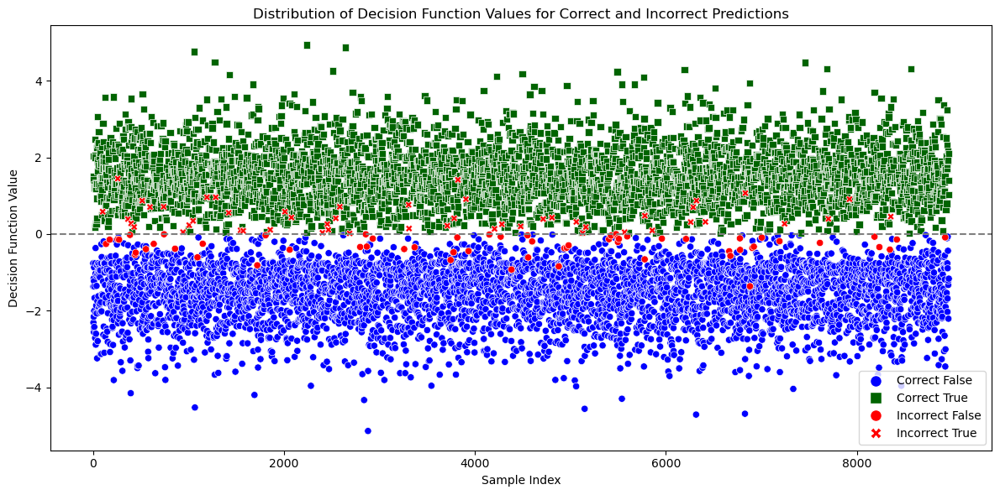

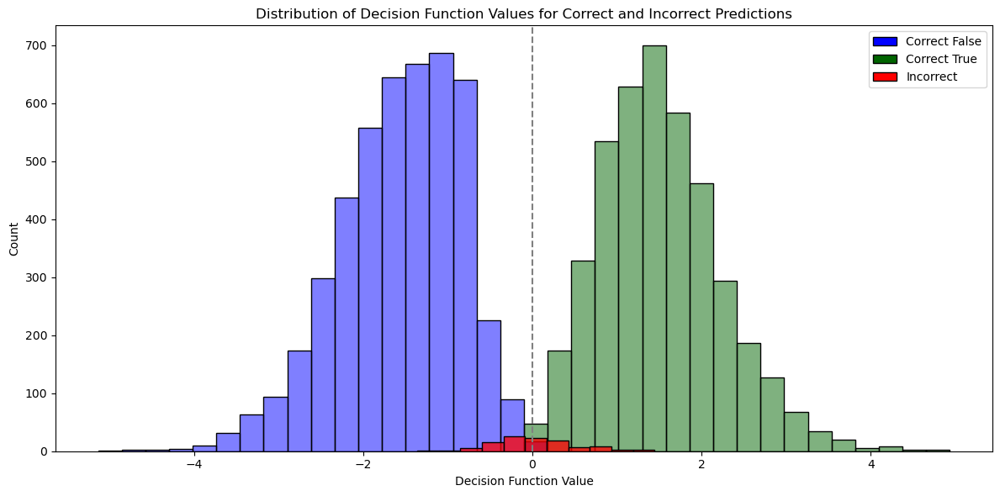


Count Vectorizer Gridsearch


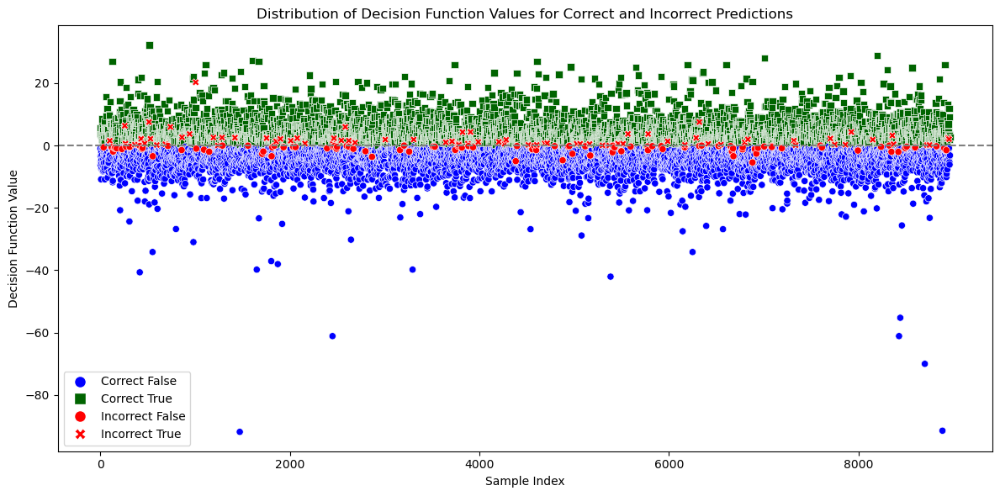

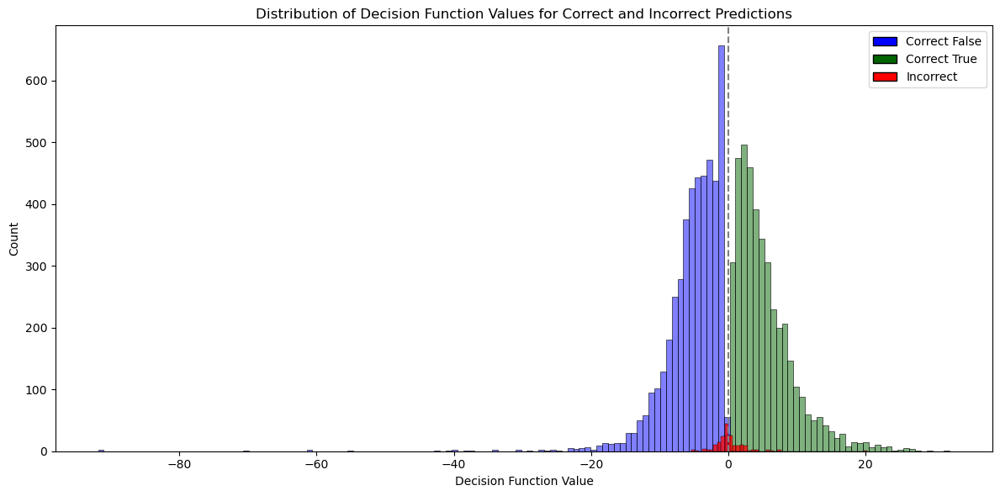


TFIDF VectorizerGridsearch


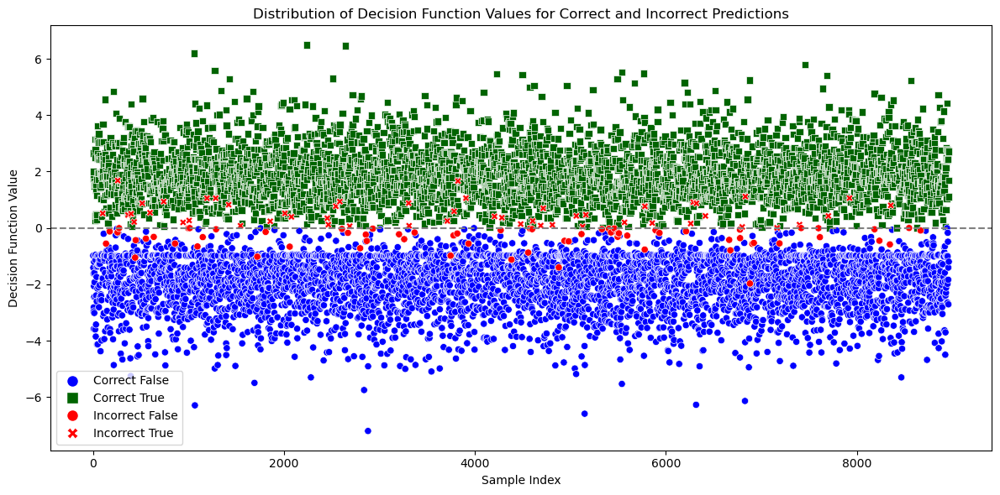

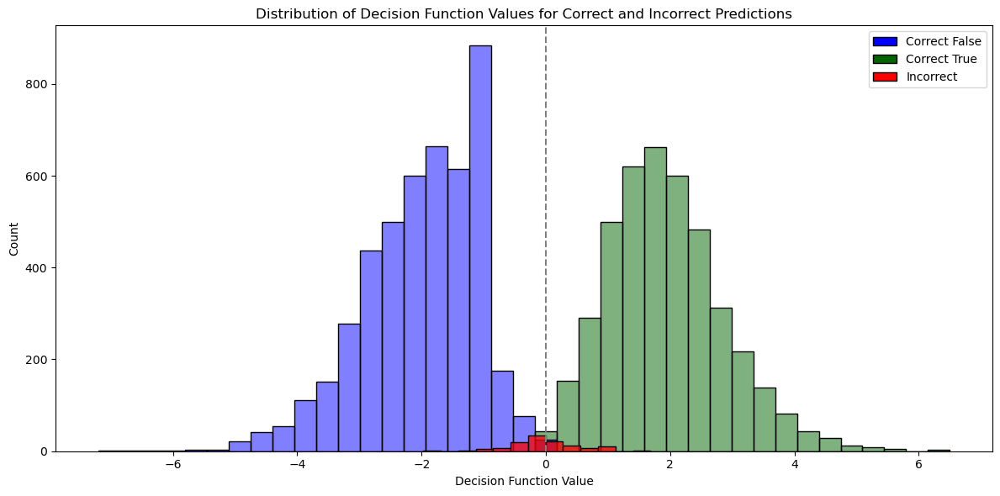

In [ ]:
print('Linear SVM')
print('Count Vectorizer')
linearsvm_count_plot_df = make_dec_func_df(y_test,count_x_test, linearsvm_count)
make_plot_df(linearsvm_count_plot_df)
print('\nTFIDF Vectorizer')
linearsvm_tfid_plot_df = make_dec_func_df(y_test,tfid_x_test, linearsvm_tfid)
make_plot_df(linearsvm_tfid_plot_df)

print('\nCount Vectorizer Gridsearch')
linearsvm_count_grid_plot_df = make_dec_func_df(y_test,count_x_test, linearsvm_count_grid)
make_plot_df(linearsvm_count_plot_df)
print('\nTFIDF VectorizerGridsearch')
linearsvm_tfid_grid_plot_df = make_dec_func_df(y_test,tfid_x_test, linearsvm_tfid_grid)
make_plot_df(linearsvm_tfid_grid_plot_df)

Top 10 features indicating real news:
          feature    weight
139188   thursday  1.045072
151364  wednesday  1.042278
117425    reuters  1.010854
143099    tuesday  0.956257
142692     trumps  0.950929
90458      monday  0.947960
54872      friday  0.942958
133733     sunday  0.697381
121970   saturday  0.627927
16635      barack  0.527845

Top 10 features indicating fake news:
           feature    weight
124228         sen -0.535621
42837          don -0.547334
115908  reportedly -0.570075
84300         mail -0.575200
42526        doesn -0.608173
40733         didn -0.641971
22226    breitbart -0.648609
115654         rep -0.655354
67874        image -0.863072
58325          gop -0.961535


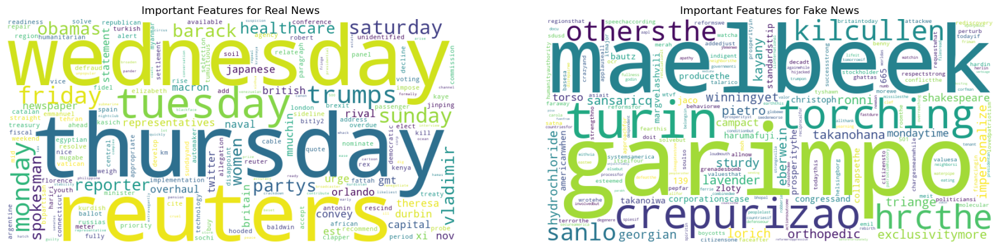

Top 10 features indicating real news:
          feature    weight
117425    reuters  7.065186
142692     trumps  6.777051
151364  wednesday  5.493217
143099    tuesday  5.475249
139188   thursday  5.399814
90458      monday  4.891547
54872      friday  4.826296
97702      obamas  3.231836
133733     sunday  3.068907
130185  spokesman  2.996010

Top 10 features indicating fake news:
          feature    weight
72077         isn -2.791329
124228        sen -2.879107
115654        rep -2.880120
153290       wire -2.885345
22226   breitbart -3.113779
40733        didn -3.668542
42837         don -3.684405
42526       doesn -3.702169
58325         gop -4.132321
67874       image -6.651224


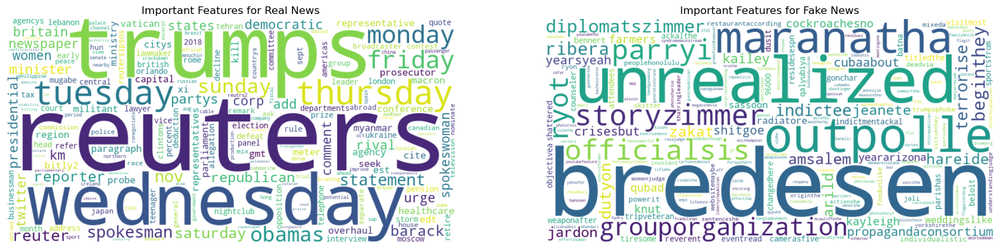

In [38]:
linearsvm_c_feature_weights = linearsvm_count.coef_[0]

linearsvm_c_feature_importance = pd.DataFrame({'feature': c_feature_names, 'weight': linearsvm_c_feature_weights})
linearsvm_c_feature_importance = linearsvm_c_feature_importance.sort_values('weight', ascending=False)

make_feature(linearsvm_c_feature_importance)


linearsvm_t_feature_weights = linearsvm_tfid.coef_[0]

linearsvm_t_feature_importance = pd.DataFrame({'feature': t_feature_names, 'weight': linearsvm_t_feature_weights})
linearsvm_t_feature_importance = linearsvm_t_feature_importance.sort_values('weight', ascending=False)

make_feature(linearsvm_t_feature_importance)

In [44]:
print_scores('SVM', 
            svm_count_report, svm_count_conf_matrix,
            svm_tfid_report, svm_tfid_conf_matrix
             )

print_scores('SVM Gridsearch',
             svm_count_grid_report, svm_count_grid_conf_matrix,
             svm_tfid_grid_report, svm_tfid_grid_conf_matrix
             )


SVM count Confusion Matrix:
[[4604   93]
 [ 101 4166]] 

SVM tfid Confusion Matrix:
[[4627   70]
 [  56 4211]]

SVM count Classification report:
              precision    recall  f1-score   support

         0.0    0.97853   0.98020   0.97937      4697
         1.0    0.97816   0.97633   0.97725      4267

    accuracy                        0.97836      8964
   macro avg    0.97835   0.97827   0.97831      8964
weighted avg    0.97836   0.97836   0.97836      8964


SVM tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.98804   0.98510   0.98657      4697
         1.0    0.98365   0.98688   0.98526      4267

    accuracy                        0.98594      8964
   macro avg    0.98585   0.98599   0.98591      8964
weighted avg    0.98595   0.98594   0.98594      8964

      

SVM Gridsearch count Confusion Matrix:
[[1978 2719]
 [   0 4267]] 

SVM Gridsearch tfid Confusion Matrix:
[[4643   54]
 [  48 4219]]

SVM Gridsearch count Clas

SVM


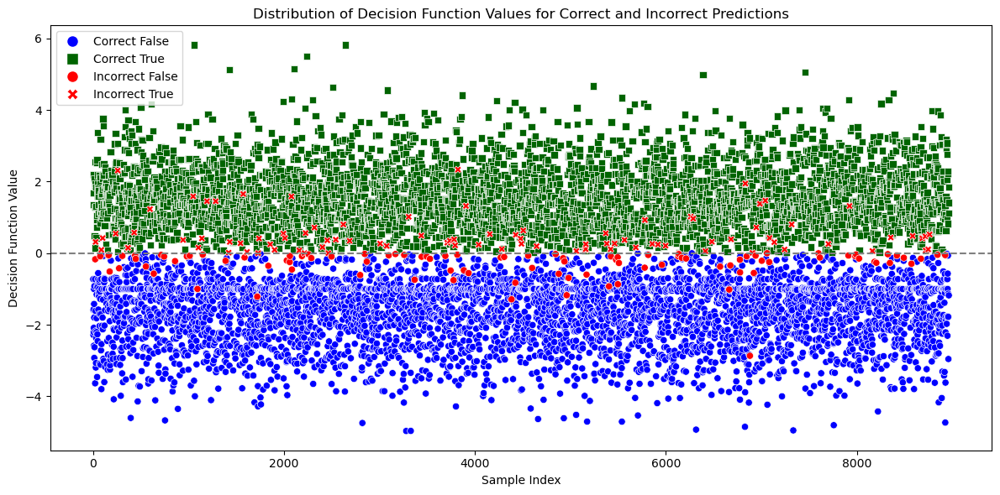

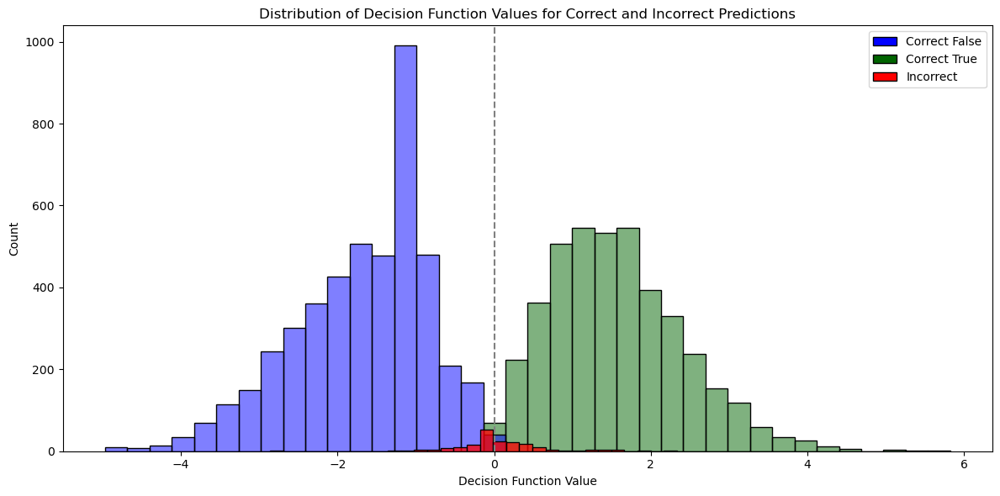

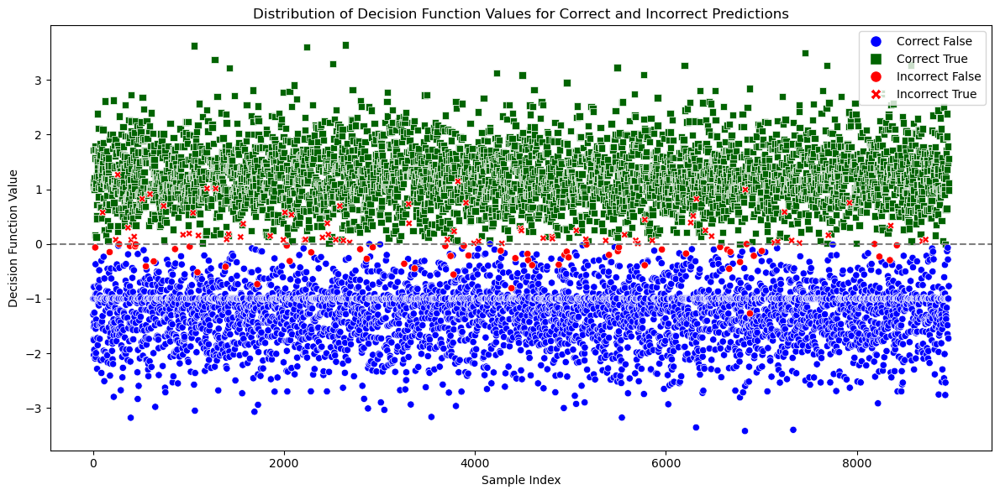

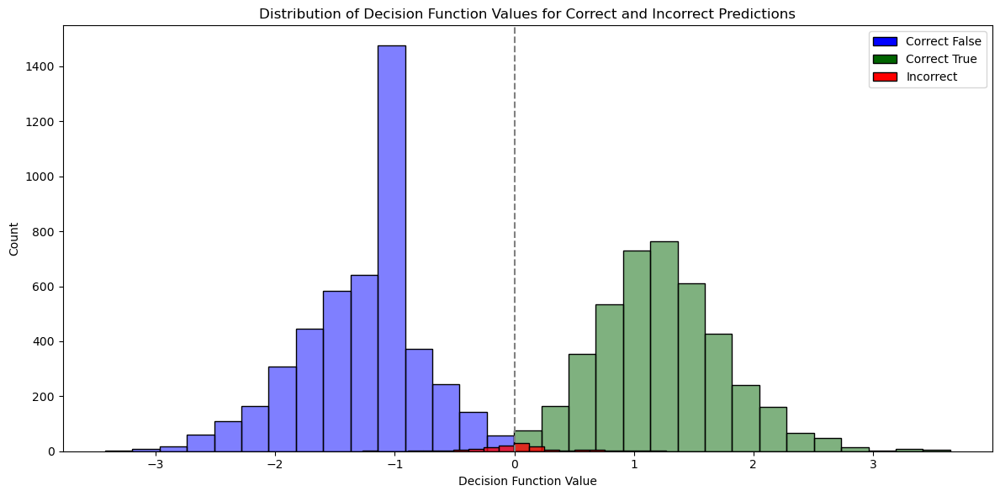


SVM Gridsearch


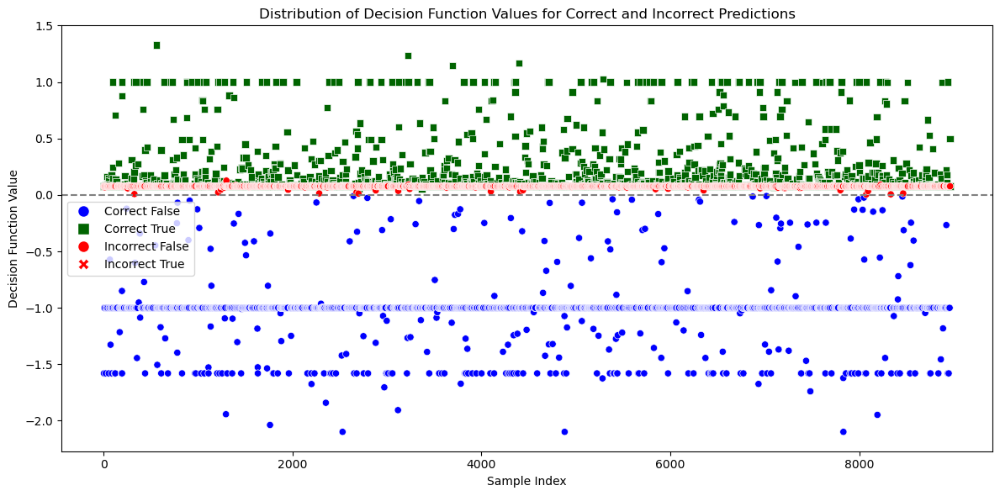

In [ ]:
print('SVM')
svm_count_plot_df = make_dec_func_df(y_test,count_x_test, svm_count)
make_plot_df(svm_count_plot_df)

svm_tfid_plot_df = make_dec_func_df(y_test,tfid_x_test, svm_tfid)
make_plot_df(svm_tfid_plot_df)

print('\nSVM Gridsearch')
svm_count_grid_plot_df = make_dec_func_df(y_test,count_x_test, svm_count_grid)
make_plot_df(svm_count_grid_plot_df)

svm_tfid_grid_plot_df = make_dec_func_df(y_test,tfid_x_test, svm_tfid_grid)
make_plot_df(svm_tfid_grid_plot_df)

Top 10 features indicating real news:
          feature    weight
139188   thursday  1.045072
151364  wednesday  1.042278
117425    reuters  1.010854
143099    tuesday  0.956257
142692     trumps  0.950929
90458      monday  0.947960
54872      friday  0.942958
133733     sunday  0.697381
121970   saturday  0.627927
16635      barack  0.527845

Top 10 features indicating fake news:
           feature    weight
124228         sen -0.535620
42837          don -0.547334
115908  reportedly -0.570075
84300         mail -0.575200
42526        doesn -0.608173
40733         didn -0.641971
22226    breitbart -0.648609
115654         rep -0.655354
67874        image -0.863072
58325          gop -0.961535


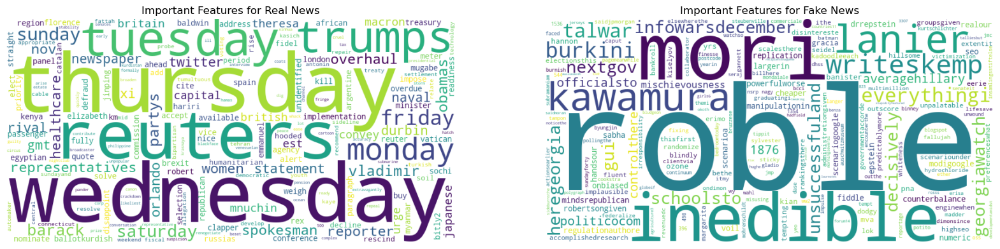

Top 10 features indicating real news:
          feature    weight
142692     trumps  3.539114
117425    reuters  3.405809
151364  wednesday  2.967335
139188   thursday  2.923320
143099    tuesday  2.722016
54872      friday  2.595094
90458      monday  2.580106
133733     sunday  1.901148
97702      obamas  1.703517
121970   saturday  1.664925

Top 10 features indicating fake news:
          feature    weight
72077         isn -1.665156
153290       wire -1.712551
84300        mail -1.766361
115654        rep -1.881463
42837         don -1.899149
22226   breitbart -1.980831
42526       doesn -2.060527
40733        didn -2.094526
67874       image -2.728070
58325         gop -2.939685


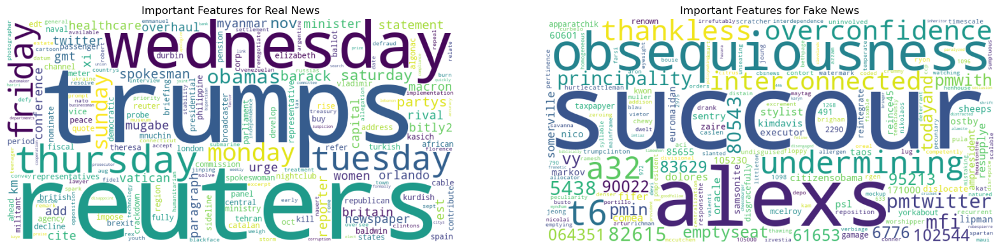

In [ ]:
svm_c_feature_weights = svm_count.dual_coef_[0]

svm_c_feature_importance = pd.DataFrame({'feature': c_feature_names, 'weight': svm_c_feature_weights})
svm_c_feature_importance = svm_c_feature_importance.sort_values('weight', ascending=False)

make_feature(svm_c_feature_importance)


svm_t_feature_weights = svm_tfid.dual_coef_[0]

svm_t_feature_importance = pd.DataFrame({'feature': c_feature_names, 'weight': svm_t_feature_weights})
svm_t_feature_importance = svm_t_feature_importance.sort_values('weight', ascending=False)

make_feature(svm_t_feature_importance)

In [48]:
print_scores('RandomForest Classifier', 
             rf_count_report, rf_count_conf_matrix,
             rf_tfid_report, rf_tfid_conf_matrix
             )

print_scores('RandomForest Classifier Gridsearch', 
             rf_count_grid_report_grid, rf_count_grid_conf_matrix,
             rf_tfid_grid_report, rf_tfid_grid_conf_matrix
             )


RandomForest Classifier count Confusion Matrix:
[[4563  134]
 [  60 4207]] 

RandomForest Classifier tfid Confusion Matrix:
[[4580  117]
 [  80 4187]]

RandomForest Classifier count Classification report:
              precision    recall  f1-score   support

         0.0    0.98702   0.97147   0.97918      4697
         1.0    0.96913   0.98594   0.97746      4267

    accuracy                        0.97836      8964
   macro avg    0.97808   0.97870   0.97832      8964
weighted avg    0.97851   0.97836   0.97836      8964


RandomForest Classifier tfid Classification report:
              precision    recall  f1-score   support

         0.0    0.98283   0.97509   0.97895      4697
         1.0    0.97282   0.98125   0.97702      4267

    accuracy                        0.97802      8964
   macro avg    0.97782   0.97817   0.97798      8964
weighted avg    0.97806   0.97802   0.97803      8964

      

RandomForest Classifier Gridsearch count Confusion Matrix:
[[4591  106]
 [ 529 

RandomForest Classifier
Count Vectorizer


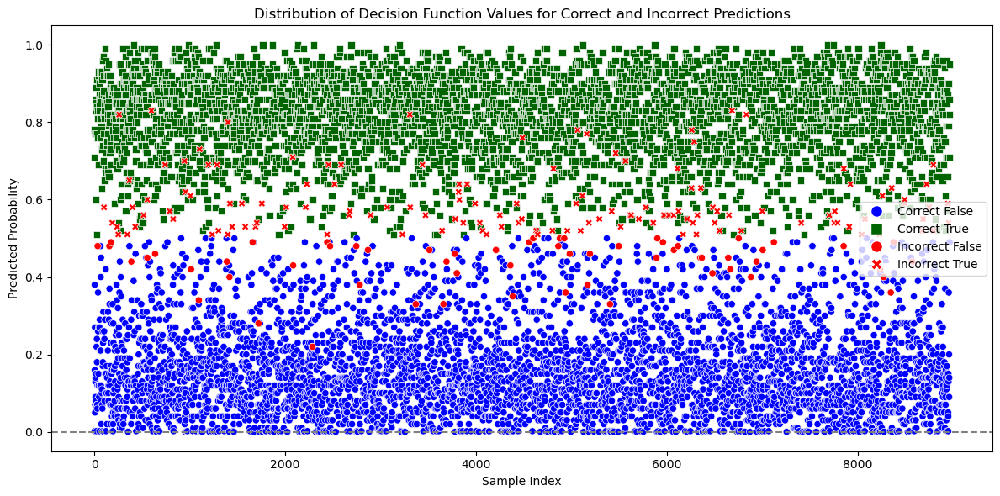

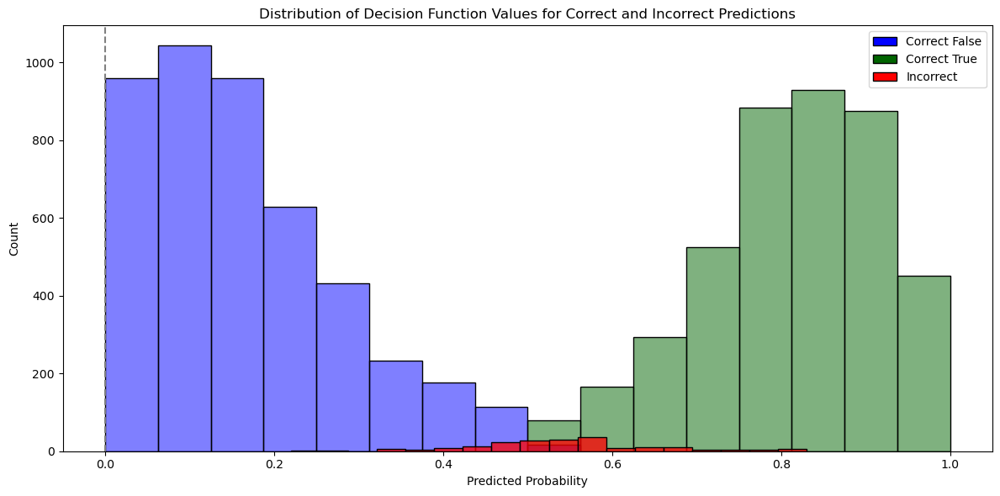


TFIDF Vectorizer


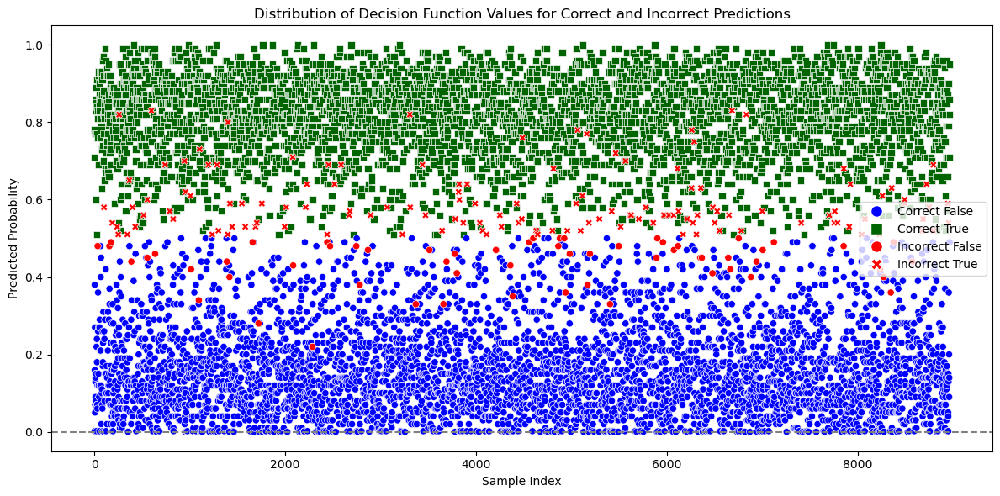

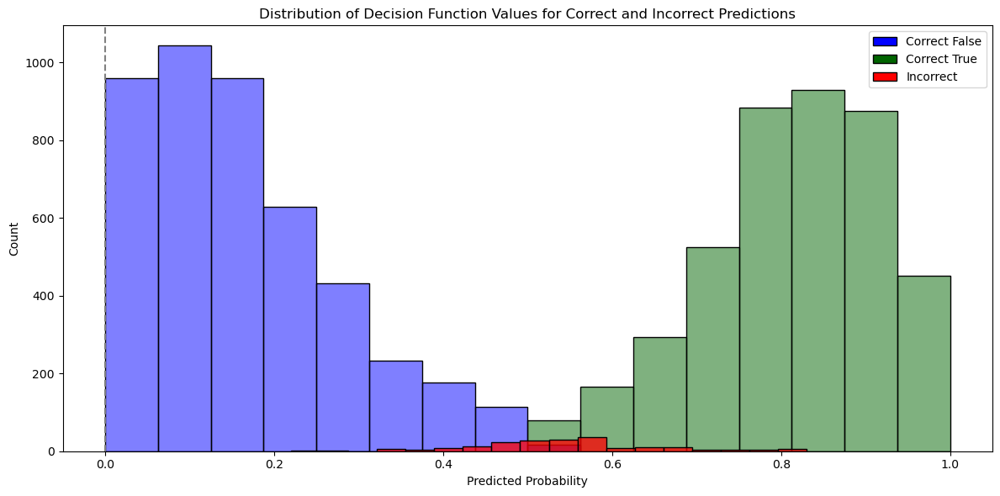


Count Vectorizer Gridsearch


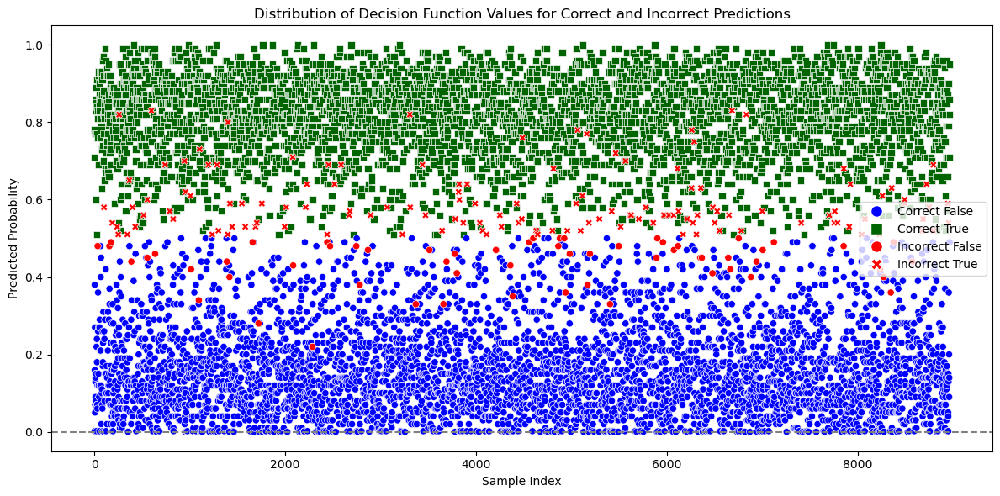

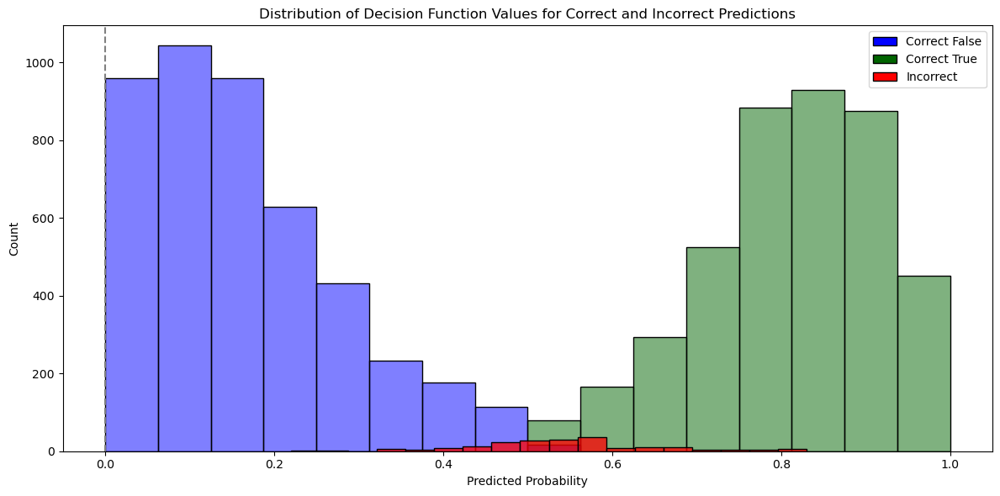


TFIDF VectorizerGridsearch


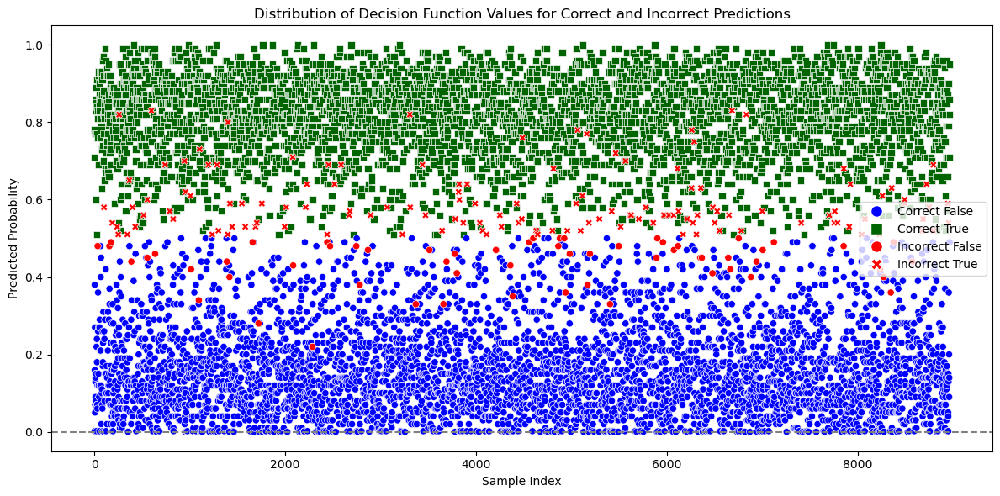

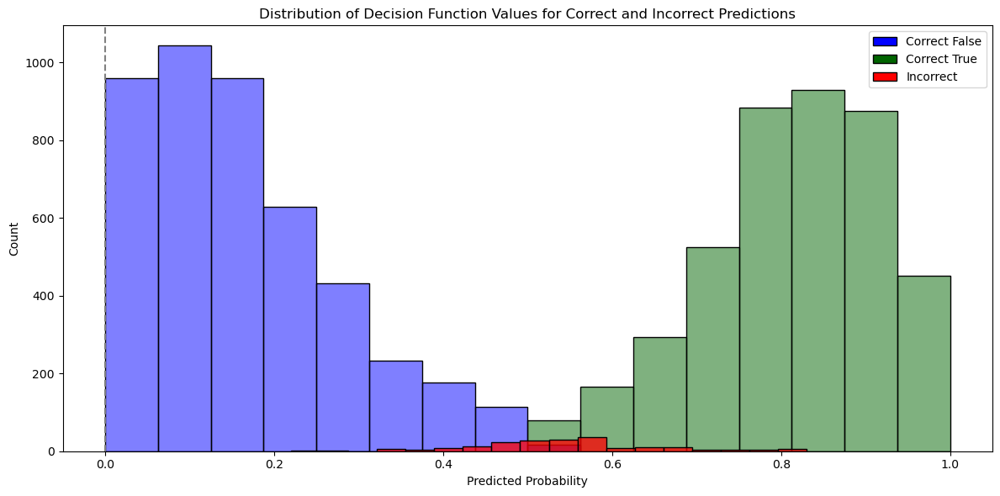

In [47]:
print('RandomForest Classifier')
print('Count Vectorizer')
rf_count_plot_df = make_prob_df(y_test,count_x_test, rf_count)
make_plot_df_prob(rf_count_plot_df)
print('\nTFIDF Vectorizer')
rf_tfid_plot_df = make_prob_df(y_test,tfid_x_test, rf_tfid)
make_plot_df_prob(rf_count_plot_df)

print('\nCount Vectorizer Gridsearch')
rf_count_grid_plot_df = make_prob_df(y_test,count_x_test, rf_count_grid)
make_plot_df_prob(rf_count_plot_df)
print('\nTFIDF VectorizerGridsearch')
rf_tfid_grid_plot_df = make_prob_df(y_test,tfid_x_test, rf_tfid_grid)
make_plot_df_prob(rf_count_plot_df)

In [52]:
import requests
from bs4 import BeautifulSoup


def get_text(url):
    response = requests.get(url)
    html_content = response.content


    soup = BeautifulSoup(html_content, 'html.parser')


    paragraphs = soup.find_all('p')
    paragraph_texts = [clean_text(p.get_text()) for p in paragraphs]

    corpus = ' '.join(paragraph_texts)

    test = t.transform([corpus])

    print(
        '\nKNeighbors Classifier count:\n',knn_count.predict(test)[0],
        '\nKNeighbors Classifier tfidf:\n',knn_tfid.predict(test)[0],
        '\nLogistic Regression count:\n',lr_count.predict(test)[0],
        '\nLogistic Regression tfidf:\n',lr_tfid.predict(test)[0],
        '\nLogisticR egression count tunned:\n',lr_count_grid.predict(test)[0],
        '\nLogistic Regression tfidf tunned:\n',lr_tfid_grid.predict(test)[0],
        '\nNaive Bayes count:\n',nb_count.predict(test)[0],
        '\nNaive Bayes tfidf:\n',nb_tfid.predict(test)[0],
        '\nNaive Bayes count tunned:\n',nb_count_grid.predict(test)[0],
        '\nNaive Bayesn tfidf tunned:\n',nb_tfid_grid.predict(test)[0],
        '\nLinearSVC count:\n',linearsvm_count.predict(test)[0],
        '\nLinearSVC tfidf:\n',linearsvm_tfid.predict(test)[0],
        '\nLinearSVC count tunned:\n',linearsvm_count_grid.predict(test)[0],
        '\nLinearSVC tfidf tunned:\n',linearsvm_tfid_grid.predict(test)[0],
        '\nSVC count:\n',svm_count.predict(test)[0],
        '\nSVC tfidf:\n',svm_tfid.predict(test)[0],
        '\nSVC count tunned:\n',svm_count_grid.predict(test)[0],
        '\nSVC tfidf tunned:\n',svm_tfid_grid.predict(test)[0],
        '\nRandom Forest Classifier count:\n',rf_count.predict(test)[0],
        '\nRandom Forest Classifier tfidf:\n',rf_tfid.predict(test)[0],
        '\nRandom Forest Classifier count tunned:\n', rf_count_grid.predict(test)[0],
        '\nRandom Forest Classifier tfidf tunned:\n', rf_tfid_grid.predict(test)[0]
        )

get_text('https://www.cnn.com/2024/07/05/politics/trump-distance-project-2025/index.html')


KNeighbors Classifier count:
 0.0 
KNeighbors Classifier tfidf:
 0.0 
Logistic Regression count:
 0.0 
Logistic Regression tfidf:
 1.0 
LogisticR egression count tunned:
 1.0 
Logistic Regression tfidf tunned:
 1.0 
Naive Bayes count:
 1.0 
Naive Bayes tfidf:
 1.0 
Naive Bayes count tunned:
 1.0 
Naive Bayesn tfidf tunned:
 1.0 
LinearSVC count:
 0.0 
LinearSVC tfidf:
 1.0 
LinearSVC count tunned:
 0.0 
LinearSVC tfidf tunned:
 1.0 
SVC count:
 0.0 
SVC tfidf:
 1.0 
SVC count tunned:
 0.0 
SVC tfidf tunned:
 1.0 
Random Forest Classifier count:
 0.0 
Random Forest Classifier tfidf:
 1.0 
Random Forest Classifier count tunned:
 0.0 
Random Forest Classifier tfidf tunned:
 0.0


In [53]:
get_text('https://www.theonion.com/pros-and-cons-of-granting-trump-presidential-immunity-1851576424')


KNeighbors Classifier count:
 0.0 
KNeighbors Classifier tfidf:
 0.0 
Logistic Regression count:
 0.0 
Logistic Regression tfidf:
 1.0 
LogisticR egression count tunned:
 0.0 
Logistic Regression tfidf tunned:
 1.0 
Naive Bayes count:
 1.0 
Naive Bayes tfidf:
 1.0 
Naive Bayes count tunned:
 1.0 
Naive Bayesn tfidf tunned:
 1.0 
LinearSVC count:
 0.0 
LinearSVC tfidf:
 1.0 
LinearSVC count tunned:
 0.0 
LinearSVC tfidf tunned:
 0.0 
SVC count:
 0.0 
SVC tfidf:
 1.0 
SVC count tunned:
 0.0 
SVC tfidf tunned:
 1.0 
Random Forest Classifier count:
 0.0 
Random Forest Classifier tfidf:
 1.0 
Random Forest Classifier count tunned:
 0.0 
Random Forest Classifier tfidf tunned:
 0.0


In [54]:
get_text('https://www.cnn.com/2024/07/06/politics/biden-abc-interview-analysis/index.html')


KNeighbors Classifier count:
 0.0 
KNeighbors Classifier tfidf:
 0.0 
Logistic Regression count:
 0.0 
Logistic Regression tfidf:
 0.0 
LogisticR egression count tunned:
 0.0 
Logistic Regression tfidf tunned:
 1.0 
Naive Bayes count:
 0.0 
Naive Bayes tfidf:
 0.0 
Naive Bayes count tunned:
 1.0 
Naive Bayesn tfidf tunned:
 1.0 
LinearSVC count:
 0.0 
LinearSVC tfidf:
 1.0 
LinearSVC count tunned:
 0.0 
LinearSVC tfidf tunned:
 1.0 
SVC count:
 0.0 
SVC tfidf:
 0.0 
SVC count tunned:
 0.0 
SVC tfidf tunned:
 1.0 
Random Forest Classifier count:
 0.0 
Random Forest Classifier tfidf:
 0.0 
Random Forest Classifier count tunned:
 0.0 
Random Forest Classifier tfidf tunned:
 0.0
